Experimental Identification of Physically Feasible Dynamic Parameters of the 7-link WAM™ Robot using LMI–SDP Techniques
=======================================================================================================================

[![DOI](https://zenodo.org/badge/920/cdsousa/wam7_dyn_ident.png)](http://dx.doi.org/10.5281/zenodo.10537)

*Experimental code and data associated with the paper:*

**Cristóvão D. Sousa and Rui Cortesão, "Physical feasibility of robot base inertial parameter identification: A linear matrix inequality approach," The International Journal of Robotics Research, vol. 33, no. 6, pp. 931–944, May. 2014, doi: [10.1177/0278364913514870](http://dx.doi.org/10.1177/0278364913514870)**

[Postprint availabe from ResearchGate](http://www.researchgate.net/publication/262483999_Physical_feasibility_of_robot_base_inertial_parameter_identification_A_linear_matrix_inequality_approach)

------------------------


Authors
-------

- Cristóvão D. Sousa, [crisjss@gmail.com](mailto:crisjss@gmail.com)
- Rui Cortesão, [cortesao@isr.uc.pt](mailto:cortesao@isr.uc.pt)

------------------------


Research Notebook
-----------------

The research is done in [Python](http://www.python.org/) within an [IPython notebook](http://ipython.org/notebook.html) (the *WAM7 Dynamic Parameter Identification.ipynb* file).
Data is in *data* folder. Additional Python support code is in *support_funcs* folder.

The file *WAM7 Dynamic Parameter Identification.html* is a **preview** of the notebook. **It can be seen online at:**

**[Experimental WAM Robot Dynamic Identification with LMI](http://goo.gl/dOPj8j)**



How to run the code
-------------------

- clone the git repository (it contains code and data) from https://github.com/cdsousa/wam7_dyn_ident
- open the *WAM7 Dynamic Parameter Identification.ipynb* notebook with [IPython](http://ipython.org/)
- edit and run the code

Dependencies:

- [Python](http://www.python.org/)
- [IPython](http://ipython.org/)
- [SymPy](http://sympy.org/)
- [Numpy](http://www.numpy.org/)
- [SciPy](http://www.scipy.org/)
- [SymPyBotics](https://github.com/cdsousa/SymPyBotics)
- [PyLMI-SDP](https://github.com/cdsousa/PyLMI-SDP)

------------------------


Questions & Feedback
--------------------

Feel free to contact the authors at [crisjss@gmail.com](mailto:crisjss@gmail.com)

------------------------


License
-------

Copyright (c) 2013, Cristóvão Duarte Sousa, Rui Cortesão

All rights reserved.

[![Creative Commons License](http://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png)](http://creativecommons.org/licenses/by-nc-sa/4.0/)
This work is licensed under a [Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License](http://creativecommons.org/licenses/by-nc-sa/4.0/)


---------------

---------------

---------------

---------------

# Initializations

In [1]:
datafolder = 'data/'
tmpfolder = 'tmp/'

In [2]:
from sympy import init_printing
init_printing()

%pylab inline

Populating the interactive namespace from numpy and matplotlib


1 - Robot Model
===============

In [3]:
import sympybotics

#### Robot Definition

In [4]:
rbtdef = sympybotics.RobotDef("tmi5_2dof",
            [(0, 0, 0.3055, "q"),
             ("-pi/2", 0, 0.1925, "q")],
            dh_convention="mdh")
#rbtdef.frictionmodel = {}
rbtdef.frictionmodel = {'Coulomb','viscous'}

#### Model Generation

In [5]:
%time rbt = sympybotics.RobotDynCode(rbtdef)
%time rbt.calc_base_parms()
Hb_code_str = sympybotics.robotcodegen.robot_code_to_func('C',rbt.Hb_code,'Hb_matrix','taimi5_2dof_mdh_Hb_fun',rbtdef)
print(Hb_code_str)

CPU times: user 359 ms, sys: 7.85 ms, total: 367 ms
Wall time: 356 ms
CPU times: user 940 ms, sys: 600 ms, total: 1.54 s
Wall time: 629 ms
void taimi5_2dof_mdh_Hb_fun( double* Hb_matrix, const double* q, const double* dq, const double* ddq )
{
  double x0 = sin(q[1]);
  double x1 = -ddq[0];
  double x2 = x0*x1;
  double x3 = cos(q[1]);
  double x4 = -dq[0];
  double x5 = x3*x4;
  double x6 = dq[1]*x5;
  double x7 = x2 + x6;
  double x8 = x0*x4;
  double x9 = dq[1]*x8;
  double x10 = -x9;
  double x11 = x10*x3;
  double x12 = x1*x3;
  double x13 = dq[0]*dq[1]*x0 + x12;
  double x14 = -x0;
  double x15 = -x3;
  double x16 = x5*x8;
  double x17 = ddq[1] + x16;
  double x18 = ((x8)*(x8));
  double x19 = -x18;
  double x20 = ((dq[1])*(dq[1]));
  double x21 = -x20;
  double x22 = ((x5)*(x5));
  double x23 = -x16;
  double x24 = -0.1925*((dq[0])*(dq[0]));
  double x25 = -x22;
  double x26 = 0.1925*x0;
//
  Hb_matrix[0] = ddq[0];
  Hb_matrix[1] = dq[0];
  Hb_matrix[2] = sign(dq[0]);
  Hb_matri

In [6]:
import pickle
with open(tmpfolder + 'robotmodels/taimi5_2dof_mdh_model.pkl', 'wb') as file:
    pickle.dump( rbt, file )

## Base Dynamic Parameters

In [7]:
import pickle
with open(tmpfolder +  'robotmodels/taimi5_2dof_mdh_model.pkl', 'rb' ) as file:
          rbt = pickle.load( file )

In [8]:
rbt.dyn.n_dynparms, rbt.dyn.n_base

(24, 12)

In [9]:
rbt.dyn.baseparms.n()

Matrix([
[L_1zz + L_2yy + 0.385*l_2z + 0.03705625*m_2],
[                                       fv_1],
[                                       fc_1],
[                              L_2xx - L_2yy],
[                                      L_2xy],
[                                      L_2xz],
[                                      L_2yz],
[                                      L_2zz],
[                                       l_2x],
[                                       l_2y],
[                                       fv_2],
[                                       fc_2]])

2 - Excited Trajectory Optimization
==================================

In [10]:
import pickle
with open(tmpfolder +  'robotmodels/taimi5_2dof_mdh_model.pkl', 'rb' ) as file:
          rbt = pickle.load( file )

In [11]:
from trajectory_optimization import TrajOptimizer
from trajectory_optimization import TrajPlotter
from numpy import deg2rad



base_freq = 0.05
fourier_order = 6

joint_constraints = []
cartesian_constraints = []


joint_constraints = [(1, deg2rad(-180), deg2rad(180), deg2rad(-120), deg2rad(120)),
                     (2, deg2rad(-150), deg2rad(-30), deg2rad(-120), deg2rad(120))]

    
traj_optimizer = TrajOptimizer(rbt, fourier_order, base_freq,
                               joint_constraints=joint_constraints,
                               cartesian_constraints = cartesian_constraints)
                                                                                                 
                                                                                                                     
traj_optimizer.optimize()

joint constraint number: 2
cartesian constraint number: 0
constraint number: 8
frames_constrained: []
('q:', array([[-1.41084574e+01, -1.61397522e+01],
       [-1.10288199e+01, -1.23588813e+01],
       [-7.31129799e+00, -8.03567801e+00],
       [-3.30755297e+00, -3.74564438e+00],
       [ 6.08766598e-01, -9.29372672e-03],
       [ 4.11244962e+00,  2.80723445e+00],
       [ 6.98266768e+00,  4.55371498e+00],
       [ 9.13223522e+00,  5.30648157e+00],
       [ 1.06049145e+01,  5.32751711e+00],
       [ 1.15435082e+01,  4.98368626e+00],
       [ 1.21385192e+01,  4.64706331e+00],
       [ 1.25714548e+01,  4.60121894e+00],
       [ 1.29674099e+01,  4.97601766e+00],
       [ 1.33683580e+01,  5.72564819e+00],
       [ 1.37325725e+01,  6.65334470e+00],
       [ 1.39584581e+01,  7.47446820e+00],
       [ 1.39246966e+01,  7.90028741e+00],
       [ 1.35346579e+01,  7.72021799e+00],
       [ 1.27524523e+01,  6.86147499e+00],
       [ 1.16208393e+01,  5.41159150e+00],
       [ 1.02565750e+01,  3.599

cond: 12.8030933734
('q:', array([[-1.41084574e+01, -1.61397512e+01],
       [-1.10288199e+01, -1.23588803e+01],
       [-7.31129799e+00, -8.03567701e+00],
       [-3.30755297e+00, -3.74564338e+00],
       [ 6.08766598e-01, -9.29272672e-03],
       [ 4.11244962e+00,  2.80723545e+00],
       [ 6.98266768e+00,  4.55371598e+00],
       [ 9.13223522e+00,  5.30648257e+00],
       [ 1.06049145e+01,  5.32751811e+00],
       [ 1.15435082e+01,  4.98368726e+00],
       [ 1.21385192e+01,  4.64706431e+00],
       [ 1.25714548e+01,  4.60121994e+00],
       [ 1.29674099e+01,  4.97601866e+00],
       [ 1.33683580e+01,  5.72564919e+00],
       [ 1.37325725e+01,  6.65334570e+00],
       [ 1.39584581e+01,  7.47446920e+00],
       [ 1.39246966e+01,  7.90028841e+00],
       [ 1.35346579e+01,  7.72021899e+00],
       [ 1.27524523e+01,  6.86147599e+00],
       [ 1.16208393e+01,  5.41159250e+00],
       [ 1.02565750e+01,  3.59923804e+00],
       [ 8.82515062e+00,  1.73956937e+00],
       [ 7.50247570e+00,  1

cond: 8.95773370352
('q:', array([[-1.95990915, -2.24444909],
       [-1.29219513, -1.76272975],
       [-0.49954877, -1.23040327],
       [ 0.34353115, -0.78012587],
       [ 1.15409227, -0.52359877],
       [ 1.85839494, -0.52359877],
       [ 2.40670484, -0.77848874],
       [ 2.78159369, -1.22304613],
       [ 2.99790344, -1.7452731 ],
       [ 3.09473646, -2.21479801],
       [ 3.1218902 , -2.51558339],
       [ 3.12452423, -2.57465064],
       [ 3.13018918, -2.3796535 ],
       [ 3.14159554, -1.98106448],
       [ 3.1368802 , -1.47870269],
       [ 3.07708911, -0.99629357],
       [ 2.91868416, -0.65069351],
       [ 2.62760417, -0.52359877],
       [ 2.19108467, -0.64272048],
       [ 1.6241297 , -0.976809  ],
       [ 0.96901891, -1.44526472],
       [ 0.2881035 , -1.93935225],
       [-0.34811685, -2.34920549],
       [-0.87449965, -2.58958499],
       [-1.24294945, -2.61799388],
       [-1.42955441, -2.44104416],
       [-1.43580105, -2.10823082],
       [-1.28417177, -1.6956

cond: 8.95773354402
('q:', array([[-1.95990915, -2.24444809],
       [-1.29219541, -1.76272875],
       [-0.49954932, -1.23040227],
       [ 0.34353033, -0.78012487],
       [ 1.15409118, -0.52359777],
       [ 1.8583936 , -0.52359777],
       [ 2.40670324, -0.77848774],
       [ 2.78159186, -1.22304513],
       [ 2.99790139, -1.7452721 ],
       [ 3.0947342 , -2.21479701],
       [ 3.12188776, -2.51558239],
       [ 3.12452162, -2.57464964],
       [ 3.13018643, -2.3796525 ],
       [ 3.14159265, -1.98106348],
       [ 3.13687721, -1.47870169],
       [ 3.07708603, -0.99629257],
       [ 2.91868102, -0.65069251],
       [ 2.627601  , -0.52359777],
       [ 2.19108149, -0.64271948],
       [ 1.62412653, -0.976808  ],
       [ 0.96901577, -1.44526372],
       [ 0.28810043, -1.93935125],
       [-0.34811984, -2.34920449],
       [-0.87450254, -2.58958399],
       [-1.2429522 , -2.61799288],
       [-1.42955701, -2.44104316],
       [-1.43580349, -2.10822982],
       [-1.28417403, -1.6956

('dq: ', array([[ 1.80926228,  1.25591906],
       [ 2.09439512,  1.81870809],
       [ 2.09439508,  1.92909635],
       [ 1.85990849,  1.55958683],
       [ 1.49396328,  0.80369548],
       [ 1.12493826, -0.14778241],
       [ 0.87261757, -1.05516705],
       [ 0.81609336, -1.69057074],
       [ 0.97196371, -1.89536785],
       [ 1.28874366, -1.61985157],
       [ 1.65929433, -0.9350998 ],
       [ 1.94842591, -0.0142357 ],
       [ 2.02884602,  0.9118979 ],
       [ 1.81634446,  1.61315292],
       [ 1.29513633,  1.91761702],
       [ 0.52664195,  1.75373186],
       [-0.36092129,  1.16657702],
       [-1.19995843,  0.30465618],
       [-1.82146457, -0.61889947],
       [-2.09439511, -1.38035895],
       [-1.9568942 , -1.8006479 ],
       [-1.43181638, -1.78786154],
       [-0.62282432, -1.35669021],
       [ 0.30791951, -0.62062141],
       [ 1.17502281,  0.2401085 ],
       [ 1.80963623,  1.02570536],
       [ 2.09439509,  1.56646908],
       [ 1.9856339 ,  1.76207984],
       [ 1.

cond: 7.07601758599
('q:', array([[-0.3542426 , -0.74743749],
       [ 0.05540014, -0.57813096],
       [ 0.54869254, -0.52359878],
       [ 1.09702852, -0.616416  ],
       [ 1.65501092, -0.86178262],
       [ 2.17058677, -1.23197967],
       [ 2.59700245, -1.66912793],
       [ 2.90329157, -2.09614458],
       [ 3.08044094, -2.43353956],
       [ 3.14159265, -2.61799388],
       [ 3.1162989 , -2.61799388],
       [ 3.04049625, -2.44236888],
       [ 2.94505698, -2.13927293],
       [ 2.84617954, -1.785541  ],
       [ 2.74038598, -1.46881888],
       [ 2.60563244, -1.26676515],
       [ 2.40834847, -1.22844557],
       [ 2.1145613 , -1.36255562],
       [ 1.70208217, -1.63542526],
       [ 1.17035989, -1.97930958],
       [ 0.54514895, -2.30887842],
       [-0.12353881, -2.54175924],
       [-0.76997641, -2.61799388],
       [-1.32581279, -2.51359726],
       [-1.73453543, -2.24496651],
       [-1.96371382, -1.86327012],
       [-2.01195314, -1.44052477],
       [-1.90880648, -1.0511

cond: 7.0760140312
('q:', array([[-1.09238804, -0.92880784],
       [-0.68793381, -0.65935765],
       [-0.19736971, -0.52359877],
       [ 0.36393107, -0.560924  ],
       [ 0.9634352 , -0.77877251],
       [ 1.55703914, -1.14693141],
       [ 2.09767746, -1.60093505],
       [ 2.54461782, -2.05437485],
       [ 2.87096602, -2.41753924],
       [ 3.06744616, -2.61799388],
       [ 3.14159265, -2.61799388],
       [ 3.11279035, -2.42421818],
       [ 3.00476278, -2.087113  ],
       [ 2.83780842, -1.68968553],
       [ 2.62312483, -1.32825107],
       [ 2.36092578, -1.08971665],
       [ 2.04292234, -1.03093079],
       [ 1.65842235, -1.16518278],
       [ 1.20217619, -1.45919141],
       [ 0.68148451, -1.84132098],
       [ 0.1201739 , -2.218962  ],
       [-0.44216669, -2.50073408],
       [-0.95601127, -2.61799388],
       [-1.3716647 , -2.54036189],
       [-1.65065178, -2.28155438],
       [-1.77578144, -1.89430975],
       [-1.75708666, -1.45598059],
       [-1.63174782, -1.04870

('dq: ', array([[ 8.47869735e-01, -8.89800825e-01],
       [ 9.05826479e-01, -4.62395835e-01],
       [ 8.71183629e-01, -7.21286201e-02],
       [ 8.11351156e-01,  2.13241652e-01],
       [ 7.95687316e-01,  3.70212803e-01],
       [ 8.74557047e-01,  4.20174829e-01],
       [ 1.06322312e+00,  4.16510548e-01],
       [ 1.33512611e+00,  4.22548751e-01],
       [ 1.62664781e+00,  4.87297630e-01],
       [ 1.85239243e+00,  6.26424643e-01],
       [ 1.92717607e+00,  8.14349828e-01],
       [ 1.78905338e+00,  9.90040958e-01],
       [ 1.41733526e+00,  1.07506468e+00],
       [ 8.40776218e-01,  9.98792668e-01],
       [ 1.33619117e-01,  7.23418883e-01],
       [-5.99678358e-01,  2.61259787e-01],
       [-1.24727549e+00, -3.21236781e-01],
       [-1.71461841e+00, -9.14768314e-01],
       [-1.94476264e+00, -1.39149640e+00],
       [-1.92931390e+00, -1.63643027e+00],
       [-1.70741315e+00, -1.57770803e+00],
       [-1.35330874e+00, -1.20759418e+00],
       [-9.56003457e-01, -5.88221547e-01],
  

cond: 6.46464061354
('q:', array([[-0.64666832, -0.81929038],
       [-0.23908112, -0.61031056],
       [ 0.25313031, -0.52359918],
       [ 0.80660231, -0.59443228],
       [ 1.38103393, -0.82889696],
       [ 1.92752152, -1.19828631],
       [ 2.39918796, -1.64211187],
       [ 2.76119796, -2.07959632],
       [ 2.99745453, -2.42720022],
       [ 3.11221854, -2.61799343],
       [ 3.12631951, -2.61799366],
       [ 3.06913678, -2.4351783 ],
       [ 2.96871054, -2.11860941],
       [ 2.84286348, -1.74756711],
       [ 2.69393159, -1.41313172],
       [ 2.50868867, -1.19662567],
       [ 2.26357993, -1.15019798],
       [ 1.93385557, -1.28436404],
       [ 1.50403751, -1.5656079 ],
       [ 0.97668519, -1.92464331],
       [ 0.37678933, -2.27325636],
       [-0.24976744, -2.52550597],
       [-0.84367641, -2.61799325],
       [-1.34397735, -2.5241999 ],
       [-1.70130349, -2.25946096],
       [-1.88926165, -1.87556682],
       [-1.91098427, -1.44664801],
       [-1.79904604, -1.0501

cond: 6.44990602635
('q:', array([[-0.65062294, -0.82266909],
       [-0.24226506, -0.61258828],
       [ 0.2503284 , -0.5245586 ],
       [ 0.80379783, -0.59407033],
       [ 1.37795624, -0.82743262],
       [ 1.92407825, -1.19611802],
       [ 2.39546841, -1.63973252],
       [ 2.75741736, -2.07748449],
       [ 2.9938575 , -2.42571328],
       [ 3.10897103, -2.6172881 ],
       [ 3.12342156, -2.61799388],
       [ 3.0663827 , -2.43559871],
       [ 2.96571014, -2.11902943],
       [ 2.83912156, -1.74753792],
       [ 2.68896695, -1.41229034],
       [ 2.50216318, -1.19478846],
       [ 2.25540471, -1.14741084],
       [ 1.92424676, -1.28089727],
       [ 1.49350623, -1.56189738],
       [ 0.96596216, -1.92119285],
       [ 0.36670051, -2.27052536],
       [-0.25844656, -2.52380983],
       [-0.8503559 , -2.61744037],
       [-1.34834873, -2.52467947],
       [-1.70337811, -2.2606828 ],
       [-1.88934719, -1.87714158],
       [-1.90960932, -1.44818606],
       [-1.7968532 , -1.0513

cond: 6.44990689072
('q:', array([[-0.65062294, -0.82267228],
       [-0.24226533, -0.61259145],
       [ 0.25032794, -0.52456174],
       [ 0.8037973 , -0.59407341],
       [ 1.37795578, -0.82743561],
       [ 1.92407798, -1.19612091],
       [ 2.39546841, -1.63973527],
       [ 2.75741763, -2.0774871 ],
       [ 2.99385796, -2.42571572],
       [ 3.10897156, -2.61729035],
       [ 3.12342202, -2.61799592],
       [ 3.06638297, -2.43560054],
       [ 2.96571014, -2.11903102],
       [ 2.8391213 , -1.74753927],
       [ 2.68896649, -1.41229143],
       [ 2.50216265, -1.19478929],
       [ 2.25540425, -1.1474114 ],
       [ 1.9242465 , -1.28089754],
       [ 1.49350623, -1.56189738],
       [ 0.96596242, -1.92119258],
       [ 0.36670097, -2.27052481],
       [-0.25844603, -2.523809  ],
       [-0.85035544, -2.61743929],
       [-1.34834846, -2.52467813],
       [-1.70337811, -2.26068121],
       [-1.88934746, -1.87713975],
       [-1.90960978, -1.44818401],
       [-1.79685373, -1.0513

('q:', array([[-0.65045322, -0.82267732],
       [-0.24207001, -0.61259684],
       [ 0.25052985, -0.5245618 ],
       [ 0.80398551, -0.59406341],
       [ 1.37811334, -0.82741325],
       [ 1.92419461, -1.19608719],
       [ 2.39554166, -1.63969451],
       [ 2.75745183, -2.07744603],
       [ 2.9938613 , -2.42568195],
       [ 3.10895238, -2.61727047],
       [ 3.12338534, -2.61799388],
       [ 3.0663284 , -2.43561662],
       [ 2.96563171, -2.11906177],
       [ 2.83900921, -1.74757831],
       [ 2.68881047, -1.41233104],
       [ 2.50195574, -1.19482225],
       [ 2.25514611, -1.14743271],
       [ 1.92394517, -1.2809055 ],
       [ 1.49317782, -1.56189374],
       [ 0.96562866, -1.92118192],
       [ 0.36638528, -2.27051306],
       [-0.25872315, -2.52380181],
       [-0.85058039, -2.61744043],
       [-1.34851714, -2.52468863],
       [-1.70349628, -2.26069925],
       [-1.88942906, -1.87716141],
       [-1.90967347, -1.44820464],
       [-1.79691862, -1.05140854],
       [-1.60

cond: 6.44946602237
('q:', array([[-0.65045386, -0.82267732],
       [-0.24207059, -0.61259684],
       [ 0.25052944, -0.5245618 ],
       [ 0.80398535, -0.59406341],
       [ 1.37811345, -0.82741325],
       [ 1.92419498, -1.19608719],
       [ 2.39554221, -1.63969451],
       [ 2.75745246, -2.07744603],
       [ 2.99386189, -2.42568195],
       [ 3.10895283, -2.61727047],
       [ 3.12338556, -2.61799388],
       [ 3.06632835, -2.43561662],
       [ 2.96563139, -2.11906177],
       [ 2.83900869, -1.74757831],
       [ 2.68880985, -1.41233104],
       [ 2.50195512, -1.19482225],
       [ 2.25514562, -1.14743271],
       [ 1.9239449 , -1.2809055 ],
       [ 1.49317782, -1.56189374],
       [ 0.96562893, -1.92118192],
       [ 0.36638576, -2.27051306],
       [-0.25872253, -2.52380181],
       [-0.85057976, -2.61744043],
       [-1.34851662, -2.52468863],
       [-1.70349596, -2.26069925],
       [-1.88942901, -1.87716141],
       [-1.90967369, -1.44820464],
       [-1.79691907, -1.0514

cond: 6.44946701809
('q:', array([[-0.65045322, -0.82267795],
       [-0.24207001, -0.61259742],
       [ 0.25052985, -0.52456221],
       [ 0.80398551, -0.59406358],
       [ 1.37811334, -0.82741314],
       [ 1.92419461, -1.19608682],
       [ 2.39554166, -1.63969396],
       [ 2.75745183, -2.0774454 ],
       [ 2.9938613 , -2.42568135],
       [ 3.10895238, -2.61727002],
       [ 3.12338534, -2.61799366],
       [ 3.0663284 , -2.43561668],
       [ 2.96563171, -2.11906209],
       [ 2.83900921, -1.74757883],
       [ 2.68881047, -1.41233167],
       [ 2.50195574, -1.19482287],
       [ 2.25514611, -1.1474332 ],
       [ 1.92394517, -1.28090576],
       [ 1.49317782, -1.56189374],
       [ 0.96562866, -1.92118165],
       [ 0.36638528, -2.27051258],
       [-0.25872315, -2.52380119],
       [-0.85058039, -2.6174398 ],
       [-1.34851714, -2.52468811],
       [-1.70349628, -2.26069894],
       [-1.88942906, -1.87716135],
       [-1.90967347, -1.44820486],
       [-1.79691862, -1.0514

cond: 6.44943726697
('q:', array([[-0.65044241, -0.82267689],
       [-0.24205743, -0.61259685],
       [ 0.2505431 , -0.5245618 ],
       [ 0.80399819, -0.59406298],
       [ 1.37812435, -0.82741213],
       [ 1.92420323, -1.19608536],
       [ 2.39554762, -1.63969219],
       [ 2.75745525, -2.07744364],
       [ 2.99386257, -2.42567997],
       [ 3.10895193, -2.61726935],
       [ 3.12338342, -2.61799388],
       [ 3.06632497, -2.43561774],
       [ 2.96562642, -2.11906375],
       [ 2.8390015 , -1.74758068],
       [ 2.68879977, -1.41233326],
       [ 2.5019417 , -1.19482383],
       [ 2.25512878, -1.14743334],
       [ 1.92392513, -1.28090511],
       [ 1.49315612, -1.56189256],
       [ 0.96560669, -1.92118034],
       [ 0.3663645 , -2.27051158],
       [-0.25874148, -2.52380083],
       [-0.85059548, -2.61744022],
       [-1.34852879, -2.52468921],
       [-1.70350493, -2.26070041],
       [-1.88943567, -1.87716278],
       [-1.90967925, -1.44820586],
       [-1.79692479, -1.0514

('dq: ', array([[ 8.47115778e-01, -8.86238165e-01],
       [ 9.06978998e-01, -4.58027573e-01],
       [ 8.74525404e-01, -6.76795751e-02],
       [ 8.16624681e-01,  2.17121627e-01],
       [ 8.02096698e-01,  3.73080373e-01],
       [ 8.80912485e-01,  4.21861137e-01],
       [ 1.06819890e+00,  4.17113865e-01],
       [ 1.33757248e+00,  4.22360679e-01],
       [ 1.62588102e+00,  4.86688865e-01],
       [ 1.84838969e+00,  6.25725543e-01],
       [ 1.92062360e+00,  8.13760129e-01],
       [ 1.78122996e+00,  9.89592541e-01],
       [ 1.40985366e+00,  1.07464456e+00],
       [ 8.35239218e-01,  9.98215153e-01],
       [ 1.31268384e-01,  7.22521465e-01],
       [-5.98239984e-01,  2.59990587e-01],
       [-1.24222454e+00, -3.22769187e-01],
       [-1.70688246e+00, -9.16300330e-01],
       [-1.93583070e+00, -1.39267088e+00],
       [-1.92092983e+00, -1.63689751e+00],
       [-1.70122241e+00, -1.57723710e+00],
       [-1.35053672e+00, -1.20616107e+00],
       [-9.57233953e-01, -5.86045781e-01],
  

('q:', array([[-0.62848333, -0.82151498],
       [-0.2169898 , -0.6125202 ],
       [ 0.27649733, -0.52454952],
       [ 0.82833586, -0.59316439],
       [ 1.39865299, -0.82502395],
       [ 1.93947936, -1.19212882],
       [ 2.40506016, -1.63464146],
       [ 2.76152801, -2.07219844],
       [ 2.99332887, -2.42131833],
       [ 3.10471513, -2.61474921],
       [ 3.11600444, -2.61788603],
       [ 3.05576488, -2.43794348],
       [ 2.95122351, -2.12328136],
       [ 2.81969216, -1.75272357],
       [ 2.66352007, -1.41726094],
       [ 2.47009274, -1.19851604],
       [ 2.21696732, -1.14924629],
       [ 1.88075834, -1.28072009],
       [ 1.44727044, -1.56011764],
       [ 0.91993165, -1.91860756],
       [ 0.32394427, -2.26807238],
       [-0.29534308, -2.52229147],
       [-0.87981028, -2.61729696],
       [-1.37009159, -2.52587907],
       [-1.71847576, -2.26275986],
       [-1.8999309 , -1.87937402],
       [-1.9183773 , -1.44985951],
       [-1.80646629, -1.05207555],
       [-1.61

cond: 6.44941526124
('q:', array([[-0.65043557, -0.82267648],
       [-0.24204972, -0.61259682],
       [ 0.25055097, -0.52456179],
       [ 0.8040054 , -0.59406266],
       [ 1.37813018, -0.82741127],
       [ 1.92420723, -1.19608393],
       [ 2.39554966, -1.63969037],
       [ 2.7574555 , -2.07744175],
       [ 2.99386134, -2.4256784 ],
       [ 3.10894956, -2.61726844],
       [ 3.12338012, -2.61799384],
       [ 3.06632071, -2.43561858],
       [ 2.96562092, -2.11906527],
       [ 2.83899437, -1.74758253],
       [ 2.68879058, -1.41233503],
       [ 2.5019302 , -1.19482516],
       [ 2.25511505, -1.14743399],
       [ 1.92390961, -1.28090505],
       [ 1.49313962, -1.56189192],
       [ 0.96559027, -1.92117942],
       [ 0.36634926, -2.2705107 ],
       [-0.25875459, -2.52380029],
       [-0.85060588, -2.61744017],
       [-1.34853635, -2.52468963],
       [-1.70351   , -2.26070115],
       [-1.88943897, -1.87716358],
       [-1.90968173, -1.44820645],
       [-1.79692738, -1.0514

cond: 6.44941571431
('q:', array([[-0.65043451, -0.82267727],
       [-0.2420487 , -0.61259757],
       [ 0.25055189, -0.5245624 ],
       [ 0.80400615, -0.59406306],
       [ 1.37813071, -0.82741141],
       [ 1.92420751, -1.19608379],
       [ 2.39554966, -1.63968997],
       [ 2.75745522, -2.07744114],
       [ 2.99386081, -2.42567766],
       [ 3.10894881, -2.61726765],
       [ 3.1233792 , -2.61799309],
       [ 3.06631968, -2.43561797],
       [ 2.96561986, -2.11906487],
       [ 2.83899334, -1.74758239],
       [ 2.68878966, -1.41233517],
       [ 2.50192945, -1.19482555],
       [ 2.25511452, -1.1474346 ],
       [ 1.92390933, -1.2809058 ],
       [ 1.49313962, -1.56189272],
       [ 0.96559055, -1.92118017],
       [ 0.36634979, -2.27051131],
       [-0.25875384, -2.52380069],
       [-0.85060496, -2.6174403 ],
       [-1.34853532, -2.5246895 ],
       [-1.70350894, -2.26070075],
       [-1.88943795, -1.87716297],
       [-1.90968081, -1.4482057 ],
       [-1.79692663, -1.0514

('dq: ', array([[ 8.47105164e-01, -8.86235066e-01],
       [ 9.06975423e-01, -4.58027185e-01],
       [ 8.74529193e-01, -6.76824054e-02],
       [ 8.16634238e-01,  2.17115912e-01],
       [ 8.02108718e-01,  3.73072875e-01],
       [ 8.80922619e-01,  4.21853443e-01],
       [ 1.06820274e+00,  4.17107622e-01],
       [ 1.33756661e+00,  4.22357144e-01],
       [ 1.62586397e+00,  4.86688559e-01],
       [ 1.84836239e+00,  6.25728099e-01],
       [ 1.92058935e+00,  8.13764389e-01],
       [ 1.78119391e+00,  9.89596876e-01],
       [ 1.40982174e+00,  1.07464733e+00],
       [ 8.35216961e-01,  9.98215180e-01],
       [ 1.31259794e-01,  7.22518410e-01],
       [-5.98233267e-01,  2.59985085e-01],
       [-1.24220355e+00, -3.22775645e-01],
       [-1.70685066e+00, -9.16305767e-01],
       [-1.93579323e+00, -1.39267335e+00],
       [-1.92089248e+00, -1.63689566e+00],
       [-1.70119049e+00, -1.57723056e+00],
       [-1.35051412e+00, -1.20615066e+00],
       [-9.57222607e-01, -5.86033383e-01],
  

cond: 6.44939492491
('q:', array([[-0.65042629, -0.82267602],
       [-0.24203933, -0.6125965 ],
       [ 0.25056157, -0.52456124],
       [ 0.80401521, -0.59406153],
       [ 1.37813834, -0.82740936],
       [ 1.92421318, -1.19608123],
       [ 2.39555318, -1.63968709],
       [ 2.75745672, -2.07743826],
       [ 2.9938606 , -2.42567517],
       [ 3.10894723, -2.61726587],
       [ 3.12337646, -2.61799221],
       [ 3.06631576, -2.43561794],
       [ 2.96561452, -2.11906548],
       [ 2.83898618, -1.74758327],
       [ 2.68878028, -1.41233591],
       [ 2.50191764, -1.19482582],
       [ 2.25510037, -1.14743421],
       [ 1.92389333, -1.28090479],
       [ 1.49312262, -1.56189134],
       [ 0.96557363, -1.92117879],
       [ 0.36633408, -2.27051037],
       [-0.25876738, -2.52380054],
       [-0.85061576, -2.61744114],
       [-1.3485433 , -2.52469129],
       [-1.70351448, -2.26070329],
       [-1.88944185, -1.87716589],
       [-1.90968407, -1.44820863],
       [-1.79693021, -1.0514

cond: 6.78090186931
('q:', array([[-0.1565631 , -0.79750149],
       [ 0.32094208, -0.611771  ],
       [ 0.8325511 , -0.52494552],
       [ 1.34878776, -0.57410591],
       [ 1.83660067, -0.77341973],
       [ 2.26419178, -1.10623314],
       [ 2.60586205, -1.52468853],
       [ 2.84567326, -1.95767357],
       [ 2.97900052, -2.32563247],
       [ 3.01159033, -2.55879348],
       [ 2.9564019 , -2.61424199],
       [ 2.82911344, -2.48733442],
       [ 2.64355031, -2.21422502],
       [ 2.40832745, -1.86446174],
       [ 2.12567415, -1.5251411 ],
       [ 1.79280388, -1.28033327],
       [ 1.40546385, -1.19080271],
       [ 0.96264624, -1.27909229],
       [ 0.47104813, -1.52377395],
       [-0.05215103, -1.86440471],
       [-0.57924574, -2.21603777],
       [-1.07505674, -2.48971793],
       [-1.502613  , -2.61386642],
       [-1.83024849, -2.55123486],
       [-2.03842974, -2.30724286],
       [-2.12457787, -1.92772116],
       [-2.10454188, -1.48678835],
       [-2.01013507, -1.0680

('q:', array([[-0.65042316, -0.82267586],
       [-0.2420355 , -0.61259678],
       [ 0.25056571, -0.52456179],
       [ 0.80401918, -0.5940622 ],
       [ 1.3781417 , -0.82741004],
       [ 1.92421559, -1.19608188],
       [ 2.39555451, -1.63968774],
       [ 2.75745701, -2.077439  ],
       [ 2.99386005, -2.4256761 ],
       [ 3.10894608, -2.6172671 ],
       [ 3.12337494, -2.61799375],
       [ 3.066314  , -2.43561976],
       [ 2.96561248, -2.11906746],
       [ 2.83898372, -1.74758523],
       [ 2.68877718, -1.41233765],
       [ 2.50191368, -1.19482716],
       [ 2.25509545, -1.14743503],
       [ 1.92388752, -1.28090505],
       [ 1.49311616, -1.5618911 ],
       [ 0.96556693, -1.92117816],
       [ 0.36632765, -2.27050949],
       [-0.25877308, -2.52379953],
       [-0.85062034, -2.61744009],
       [-1.34854661, -2.52469024],
       [-1.7035166 , -2.2607022 ],
       [-1.88944307, -1.87716472],
       [-1.90968484, -1.44820731],
       [-1.79693102, -1.05140991],
       [-1.60

cond: 6.44938128784
('q:', array([[-0.65042316, -0.82267586],
       [-0.24203577, -0.61259651],
       [ 0.25056525, -0.52456133],
       [ 0.80401865, -0.59406167],
       [ 1.37814124, -0.82740958],
       [ 1.92421533, -1.19608161],
       [ 2.39555451, -1.63968774],
       [ 2.75745728, -2.07743927],
       [ 2.99386051, -2.42567656],
       [ 3.10894661, -2.61726763],
       [ 3.1233754 , -2.61799421],
       [ 3.06631426, -2.43562003],
       [ 2.96561248, -2.11906746],
       [ 2.83898345, -1.74758497],
       [ 2.68877672, -1.41233719],
       [ 2.50191315, -1.19482662],
       [ 2.25509499, -1.14743457],
       [ 1.92388725, -1.28090479],
       [ 1.49311616, -1.5618911 ],
       [ 0.9655672 , -1.92117842],
       [ 0.36632811, -2.27050994],
       [-0.25877255, -2.52380006],
       [-0.85061989, -2.61744055],
       [-1.34854634, -2.52469051],
       [-1.7035166 , -2.2607022 ],
       [-1.88944333, -1.87716445],
       [-1.9096853 , -1.44820685],
       [-1.79693155, -1.0514

cond: 7.01921094371
('q:', array([[-0.60868921, -0.84735442],
       [-0.19934607, -0.63089039],
       [ 0.2906272 , -0.53343049],
       [ 0.83819874, -0.5916529 ],
       [ 1.40435265, -0.81373206],
       [ 1.94199028, -1.17328258],
       [ 2.40599782, -1.61180303],
       [ 2.76273155, -2.0496335 ],
       [ 2.99636246, -2.4031323 ],
       [ 3.11041638, -2.60399117],
       [ 3.12419556, -2.6158454 ],
       [ 3.06519992, -2.44383048],
       [ 2.95978467, -2.13439442],
       [ 2.82478606, -1.76508579],
       [ 2.66257736, -1.42658477],
       [ 2.4610537 , -1.20126407],
       [ 2.19864566, -1.14352187],
       [ 1.85301231, -1.26675654],
       [ 1.41096234, -1.54023219],
       [ 0.87671016, -1.89662215],
       [ 0.27592325, -2.2483435 ],
       [-0.34591912, -2.50859805],
       [-0.93083441, -2.61187947],
       [-1.41974818, -2.52889089],
       [-1.76527398, -2.27228938],
       [-1.94265181, -1.89204798],
       [-1.95599333, -1.46188236],
       [-1.83809386, -1.0604

cond: 6.44934541189
('q:', array([[-0.65041768, -0.8226791 ],
       [-0.24202989, -0.61259918],
       [ 0.250571  , -0.52456296],
       [ 0.80402376, -0.59406188],
       [ 1.37814532, -0.82740824],
       [ 1.92421818, -1.19607888],
       [ 2.3955562 , -1.63968407],
       [ 2.75745803, -2.07743535],
       [ 2.99386062, -2.42567314],
       [ 3.10894636, -2.61726535],
       [ 3.12337491, -2.61799347],
       [ 3.06631348, -2.43562084],
       [ 2.96561116, -2.11906947],
       [ 2.83898122, -1.74758753],
       [ 2.68877317, -1.41233952],
       [ 2.50190794, -1.194828  ],
       [ 2.25508798, -1.14743451],
       [ 1.92387851, -1.28090319],
       [ 1.49310599, -1.56188825],
       [ 0.96555609, -1.92117493],
       [ 0.36631663, -2.27050657],
       [-0.25878384, -2.52379753],
       [-0.85063054, -2.61743936],
       [-1.34855607, -2.52469079],
       [-1.70352527, -2.26070373],
       [-1.88945096, -1.87716667],
       [-1.90969199, -1.44820911],
       [-1.79693742, -1.0514

cond: 6.44934148377
('q:', array([[-0.65041768, -0.8226791 ],
       [-0.24203016, -0.61259891],
       [ 0.25057052, -0.52456245],
       [ 0.80402315, -0.59406119],
       [ 1.37814469, -0.82740745],
       [ 1.92421766, -1.1960781 ],
       [ 2.39555589, -1.63968338],
       [ 2.75745797, -2.07743483],
       [ 2.99386084, -2.42567287],
       [ 3.10894681, -2.61726535],
       [ 3.12337551, -2.61799374],
       [ 3.06631411, -2.43562135],
       [ 2.96561171, -2.11907016],
       [ 2.83898159, -1.74758832],
       [ 2.68877328, -1.4123403 ],
       [ 2.50190778, -1.19482869],
       [ 2.25508757, -1.14743502],
       [ 1.92387793, -1.28090347],
       [ 1.49310536, -1.56188825],
       [ 0.96555551, -1.92117466],
       [ 0.36631622, -2.27050606],
       [-0.25878401, -2.52379684],
       [-0.85063043, -2.61743858],
       [-1.3485557 , -2.52469001],
       [-1.70352472, -2.26070304],
       [-1.88945033, -1.87716616],
       [-1.90969139, -1.44820883],
       [-1.79693697, -1.0514

cond: 7.04919075702
('q:', array([[-5.46647243e-01, -8.13983325e-01],
       [-1.24165374e-01, -6.11242374e-01],
       [ 3.71630251e-01, -5.24508982e-01],
       [ 9.16258058e-01, -5.90117312e-01],
       [ 1.47133680e+00, -8.16494154e-01],
       [ 1.99221423e+00, -1.17790495e+00],
       [ 2.43731952e+00, -1.61666377e+00],
       [ 2.77669025e+00, -2.05388330e+00],
       [ 2.99737247e+00, -2.40651503e+00],
       [ 3.10427616e+00, -2.60661682e+00],
       [ 3.11634306e+00, -2.61799349e+00],
       [ 3.05919772e+00, -2.44583021e+00],
       [ 2.95644053e+00, -2.13658686e+00],
       [ 2.82212927e+00, -1.76783790e+00],
       [ 2.65667044e+00, -1.43030606e+00],
       [ 2.44738720e+00, -1.20638005e+00],
       [ 2.17370499e+00, -1.15038138e+00],
       [ 1.81556000e+00, -1.27548461e+00],
       [ 1.36266097e+00, -1.55057277e+00],
       [ 8.21894730e-01, -1.90783446e+00],
       [ 2.20569523e-01, -2.25921303e+00],
       [-3.95758344e-01, -2.51759727e+00],
       [-9.70700137e-01, -2

cond: 6.44933997914
('q:', array([[-0.65041602, -0.82267896],
       [-0.242028  , -0.61259916],
       [ 0.25057291, -0.52456296],
       [ 0.80402547, -0.59406182],
       [ 1.37814664, -0.82740806],
       [ 1.92421902, -1.19607859],
       [ 2.39555655, -1.6396837 ],
       [ 2.75745801, -2.07743497],
       [ 2.99386044, -2.42567283],
       [ 3.1089462 , -2.61726518],
       [ 3.12337494, -2.61799347],
       [ 3.06631373, -2.43562101],
       [ 2.96561157, -2.11906975],
       [ 2.83898158, -1.74758786],
       [ 2.68877322, -1.41233981],
       [ 2.50190744, -1.19482819],
       [ 2.25508673, -1.14743456],
       [ 1.92387647, -1.28090311],
       [ 1.49310327, -1.56188807],
       [ 0.96555295, -1.92117472],
       [ 0.36631343, -2.27050639],
       [-0.25878673, -2.52379743],
       [-0.85063281, -2.61743936],
       [-1.34855756, -2.52469088],
       [-1.70352601, -2.26070385],
       [-1.88945114, -1.87716678],
       [-1.90969194, -1.44820915],
       [-1.79693752, -1.0514

cond: 6.44934084202
('q:', array([[-0.65041602, -0.82268215],
       [-0.24202827, -0.61260233],
       [ 0.25057245, -0.52456609],
       [ 0.80402494, -0.59406489],
       [ 1.37814618, -0.82741106],
       [ 1.92421875, -1.19608147],
       [ 2.39555655, -1.63968646],
       [ 2.75745828, -2.07743758],
       [ 2.99386089, -2.42567527],
       [ 3.10894673, -2.61726743],
       [ 3.1233754 , -2.61799551],
       [ 3.066314  , -2.43562283],
       [ 2.96561157, -2.11907135],
       [ 2.83898132, -1.7475892 ],
       [ 2.68877276, -1.4123409 ],
       [ 2.50190691, -1.19482901],
       [ 2.25508627, -1.14743511],
       [ 1.9238762 , -1.28090338],
       [ 1.49310327, -1.56188807],
       [ 0.96555321, -1.92117444],
       [ 0.36631388, -2.27050584],
       [-0.2587862 , -2.52379661],
       [-0.85063236, -2.61743828],
       [-1.3485573 , -2.52468953],
       [-1.70352601, -2.26070226],
       [-1.88945141, -1.87716495],
       [-1.9096924 , -1.4482071 ],
       [-1.79693805, -1.0514

cond: 6.51556198114
('q:', array([[-0.65040046, -0.82267754],
       [-0.24201099, -0.61259889],
       [ 0.25058993, -0.52456295],
       [ 0.80404089, -0.5940613 ],
       [ 1.3781591 , -0.82740657],
       [ 1.92422767, -1.19607606],
       [ 2.39556122, -1.63968048],
       [ 2.75745914, -2.07743167],
       [ 2.99385886, -2.42567016],
       [ 3.10894288, -2.61726371],
       [ 3.12337063, -2.61799347],
       [ 3.0663088 , -2.43562234],
       [ 2.96560587, -2.11907192],
       [ 2.83897456, -1.74759011],
       [ 2.68876413, -1.41234135],
       [ 2.5018956 , -1.19482839],
       [ 2.25507182, -1.14743315],
       [ 1.9238587 , -1.28090021],
       [ 1.49308341, -1.5618842 ],
       [ 0.96553221, -1.92117065],
       [ 0.36629321, -2.27050293],
       [-0.25880515, -2.52379521],
       [-0.85064858, -2.61743865],
       [-1.34857043, -2.52469156],
       [-1.70353638, -2.26070545],
       [-1.88945995, -1.87716863],
       [-1.90970038, -1.4482106 ],
       [-1.79694674, -1.0514

cond: 6.44933565367
('q:', array([[-0.6504151 , -0.82267882],
       [-0.24202712, -0.61259913],
       [ 0.25057379, -0.52456296],
       [ 0.80402637, -0.59406177],
       [ 1.37814758, -0.82740791],
       [ 1.92422001, -1.19607834],
       [ 2.39555757, -1.63968338],
       [ 2.757459  , -2.07743464],
       [ 2.99386129, -2.42567257],
       [ 3.1089468 , -2.61726503],
       [ 3.12337514, -2.61799347],
       [ 3.06631342, -2.43562114],
       [ 2.96561068, -2.11906997],
       [ 2.83898012, -1.74758808],
       [ 2.68877127, -1.41233996],
       [ 2.50190516, -1.19482821],
       [ 2.25508434, -1.14743442],
       [ 1.92387418, -1.28090282],
       [ 1.49310128, -1.56188768],
       [ 0.96555138, -1.92117431],
       [ 0.36631231, -2.27050604],
       [-0.25878748, -2.52379721],
       [-0.85063335, -2.61743929],
       [-1.34855809, -2.52469095],
       [-1.70352673, -2.26070401],
       [-1.88945221, -1.87716696],
       [-1.90969341, -1.44820929],
       [-1.79693937, -1.0514

('q:', array([[-0.65041446, -0.82267935],
       [-0.24202654, -0.61259959],
       [ 0.2505742 , -0.52456322],
       [ 0.80402654, -0.59406177],
       [ 1.37814747, -0.82740765],
       [ 1.92421964, -1.19607788],
       [ 2.39555702, -1.63968285],
       [ 2.75745836, -2.07743418],
       [ 2.99386069, -2.4256723 ],
       [ 3.10894635, -2.61726503],
       [ 3.12337492, -2.61799373],
       [ 3.06631348, -2.4356216 ],
       [ 2.965611  , -2.1190705 ],
       [ 2.83898064, -1.74758854],
       [ 2.6887719 , -1.41234023],
       [ 2.50190578, -1.19482821],
       [ 2.25508482, -1.14743415],
       [ 1.92387445, -1.28090236],
       [ 1.49310128, -1.56188715],
       [ 0.96555111, -1.92117385],
       [ 0.36631182, -2.27050578],
       [-0.25878809, -2.52379721],
       [-0.85063398, -2.61743956],
       [-1.34855861, -2.52469141],
       [-1.70352704, -2.26070454],
       [-1.88945226, -1.87716742],
       [-1.9096932 , -1.44820956],
       [-1.79693892, -1.05141113],
       [-1.60

cond: 6.44933194233
('q:', array([[-0.65041286, -0.82267867],
       [-0.24202449, -0.6125991 ],
       [ 0.25057653, -0.52456296],
       [ 0.80402893, -0.59406172],
       [ 1.37814972, -0.82740776],
       [ 1.92422158, -1.19607808],
       [ 2.39555856, -1.63968305],
       [ 2.75745947, -2.0774343 ],
       [ 2.99386139, -2.42567229],
       [ 3.10894669, -2.61726488],
       [ 3.12337494, -2.61799347],
       [ 3.0663132 , -2.43562128],
       [ 2.96561038, -2.11907019],
       [ 2.83897964, -1.74758831],
       [ 2.68877045, -1.41234012],
       [ 2.50190383, -1.19482823],
       [ 2.25508239, -1.14743427],
       [ 1.9238716 , -1.28090252],
       [ 1.49309815, -1.56188728],
       [ 0.96554791, -1.92117389],
       [ 0.36630876, -2.27050569],
       [-0.2587908 , -2.52379698],
       [-0.85063618, -2.61743922],
       [-1.34856024, -2.52469102],
       [-1.70352811, -2.26070417],
       [-1.88945286, -1.87716716],
       [-1.90969348, -1.44820945],
       [-1.79693906, -1.0514

cond: 6.44932866648
('q:', array([[-0.65041286, -0.82267867],
       [-0.24202476, -0.61259883],
       [ 0.250576  , -0.52456244],
       [ 0.80402818, -0.59406103],
       [ 1.3781488 , -0.82740698],
       [ 1.92422056, -1.19607729],
       [ 2.3955575 , -1.63968236],
       [ 2.75745845, -2.07743379],
       [ 2.99386047, -2.42567202],
       [ 3.10894594, -2.61726488],
       [ 3.12337441, -2.61799374],
       [ 3.06631292, -2.43562179],
       [ 2.96561038, -2.11907088],
       [ 2.83897992, -1.7475891 ],
       [ 2.68877098, -1.4123409 ],
       [ 2.50190458, -1.19482892],
       [ 2.25508331, -1.14743478],
       [ 1.92387262, -1.28090279],
       [ 1.49309922, -1.56188728],
       [ 0.96554893, -1.92117362],
       [ 0.36630968, -2.27050517],
       [-0.25879005, -2.52379629],
       [-0.85063565, -2.61743844],
       [-1.34855996, -2.52469023],
       [-1.70352811, -2.26070348],
       [-1.88945314, -1.87716664],
       [-1.90969401, -1.44820917],
       [-1.79693981, -1.0514

('dq: ', array([[ 0.25669727, -0.60995628],
       [ 0.68714327, -0.34622952],
       [ 1.03850371, -0.17690482],
       [ 1.27516707, -0.12043909],
       [ 1.3797416 , -0.14822125],
       [ 1.35509691, -0.19710443],
       [ 1.22229246, -0.19262844],
       [ 1.01514226, -0.07585517],
       [ 0.77285959,  0.17428683],
       [ 0.53252392,  0.52997158],
       [ 0.32297243,  0.91835479],
       [ 0.16121208,  1.23968392],
       [ 0.05173452,  1.3948309 ],
       [-0.01160485,  1.3146107 ],
       [-0.04202541,  0.98252603],
       [-0.0557022 ,  0.44418707],
       [-0.06812811, -0.199819  ],
       [-0.09164534, -0.81633761],
       [-0.13435154, -1.27182268],
       [-0.20013146, -1.4659464 ],
       [-0.28927571, -1.35770724],
       [-0.39910075, -0.9769126 ],
       [-0.52417035, -0.41768294],
       [-0.65605718,  0.18463854],
       [-0.78293965,  0.68734963],
       [-0.88956742,  0.97626725],
       [-0.95814884,  0.99422991],
       [-0.97048833,  0.75470495],
       [-0.

cond: 6.44932848469
('q:', array([[-0.65041124, -0.82267853],
       [-0.2420227 , -0.61259908],
       [ 0.2505783 , -0.52456295],
       [ 0.80403044, -0.59406166],
       [ 1.37815076, -0.82740761],
       [ 1.924222  , -1.19607782],
       [ 2.39555829, -1.63968272],
       [ 2.75745858, -2.07743396],
       [ 2.99386003, -2.42567202],
       [ 3.10894507, -2.61726473],
       [ 3.12337329, -2.61799347],
       [ 3.06631172, -2.43562142],
       [ 2.96560921, -2.11907042],
       [ 2.83897882, -1.74758855],
       [ 2.68876994, -1.41234028],
       [ 2.50190354, -1.19482825],
       [ 2.25508219, -1.14743413],
       [ 1.92387136, -1.28090222],
       [ 1.49309777, -1.56188688],
       [ 0.96554732, -1.92117347],
       [ 0.36630794, -2.27050533],
       [-0.25879185, -2.52379675],
       [-0.85063744, -2.61743914],
       [-1.34856168, -2.52469109],
       [-1.70352973, -2.26070434],
       [-1.88945465, -1.87716735],
       [-1.90969542, -1.4482096 ],
       [-1.79694115, -1.0514

cond: 6.4493269347
('q:', array([[-0.65041124, -0.82267853],
       [-0.24202297, -0.61259881],
       [ 0.25057781, -0.52456249],
       [ 0.80402983, -0.59406113],
       [ 1.37815013, -0.82740715],
       [ 1.92422148, -1.19607755],
       [ 2.39555797, -1.63968272],
       [ 2.75745852, -2.07743423],
       [ 2.99386025, -2.42567248],
       [ 3.10894552, -2.61726526],
       [ 3.12337389, -2.61799393],
       [ 3.06631236, -2.43562168],
       [ 2.96560976, -2.11907042],
       [ 2.83897918, -1.74758828],
       [ 2.68877005, -1.41233982],
       [ 2.50190337, -1.19482772],
       [ 2.25508178, -1.14743367],
       [ 1.92387078, -1.28090195],
       [ 1.49309714, -1.56188688],
       [ 0.96554674, -1.92117373],
       [ 0.36630753, -2.27050579],
       [-0.25879202, -2.52379728],
       [-0.85063733, -2.6174396 ],
       [-1.34856132, -2.52469135],
       [-1.70352917, -2.26070434],
       [-1.88945401, -1.87716708],
       [-1.90969483, -1.44820914],
       [-1.7969407 , -1.05141

cond: 6.49786169408
('q:', array([[-0.64880307, -0.82253259],
       [-0.24023991, -0.61257129],
       [ 0.25237874, -0.52456223],
       [ 0.80567126, -0.59400865],
       [ 1.37947683, -0.82725436],
       [ 1.92513423, -1.19581838],
       [ 2.39603082, -1.63935203],
       [ 2.75753583, -2.07709557],
       [ 2.99363566, -2.42539813],
       [ 3.10852957, -2.61711414],
       [ 3.1228597 , -2.61799344],
       [ 3.06574909, -2.43575859],
       [ 2.96499103, -2.11929312],
       [ 2.83824923, -1.74781997],
       [ 2.68784549, -1.41249889],
       [ 2.50070407, -1.1948498 ],
       [ 2.25356176, -1.14728921],
       [ 1.92204032, -1.28060444],
       [ 1.49102946, -1.56148945],
       [ 0.96336715, -1.92075493],
       [ 0.36416751, -2.27014844],
       [-0.26074892, -2.52356633],
       [-0.85230889, -2.61736506],
       [-1.34991024, -2.52476128],
       [-1.70459062, -2.26087009],
       [-1.89032484, -1.87735951],
       [-1.91050706, -1.44836154],
       [-1.79782605, -1.0514

('dq: ', array([[ 8.47094946e-01, -8.86228165e-01],
       [ 9.06971068e-01, -4.58022100e-01],
       [ 8.74531218e-01, -6.76802764e-02],
       [ 8.16641397e-01,  2.17114825e-01],
       [ 8.02118177e-01,  3.73069206e-01],
       [ 8.80930559e-01,  4.21848478e-01],
       [ 1.06820527e+00,  4.17102883e-01],
       [ 1.33756077e+00,  4.22353929e-01],
       [ 1.62584853e+00,  4.86687563e-01],
       [ 1.84833835e+00,  6.25729236e-01],
       [ 1.92055989e+00,  8.13766858e-01],
       [ 1.78116379e+00,  9.89599460e-01],
       [ 1.40979640e+00,  1.07464882e+00],
       [ 8.35201348e-01,  9.98214808e-01],
       [ 1.31257301e-01,  7.22516147e-01],
       [-5.98221535e-01,  2.59981709e-01],
       [-1.24217904e+00, -3.22778750e-01],
       [-1.70681707e+00, -9.16307028e-01],
       [-1.93575580e+00, -1.39267153e+00],
       [-1.92085690e+00, -1.63689035e+00],
       [-1.70116185e+00, -1.57722246e+00],
       [-1.35049598e+00, -1.20614156e+00],
       [-9.57216515e-01, -5.86025870e-01],
  

cond: 6.44932456768
('q:', array([[-0.65040963, -0.82268156],
       [-0.24202119, -0.61260222],
       [ 0.25057961, -0.52456609],
       [ 0.80403147, -0.59406468],
       [ 1.37815146, -0.82741045],
       [ 1.92422239, -1.19608044],
       [ 2.39555845, -1.63968514],
       [ 2.7574586 , -2.07743623],
       [ 2.99386002, -2.42567418],
       [ 3.1089451 , -2.61726683],
       [ 3.12337338, -2.61799551],
       [ 3.06631179, -2.43562338],
       [ 2.96560914, -2.11907223],
       [ 2.83897845, -1.74759012],
       [ 2.68876913, -1.41234153],
       [ 2.50190218, -1.1948291 ],
       [ 2.25508026, -1.14743454],
       [ 1.92386895, -1.2809022 ],
       [ 1.49309507, -1.56188649],
       [ 0.96554456, -1.92117277],
       [ 0.36630539, -2.27050442],
       [-0.25879398, -2.5237957 ],
       [-0.850639  , -2.61743798],
       [-1.34856267, -2.52468981],
       [-1.70353024, -2.26070291],
       [-1.88945488, -1.87716572],
       [-1.90969564, -1.44820771],
       [-1.79694158, -1.0514

cond: 6.50259901815
('q:', array([[-0.64986139, -0.82300174],
       [-0.24146039, -0.61283867],
       [ 0.2511059 , -0.52467899],
       [ 0.8044805 , -0.59402976],
       [ 1.37849581, -0.82722785],
       [ 1.92445592, -1.19577837],
       [ 2.39569565, -1.63931654],
       [ 2.7575279 , -2.07706886],
       [ 2.99389289, -2.42537604],
       [ 3.1089644 , -2.61709049],
       [ 3.12338415, -2.61796537],
       [ 3.06629717, -2.43572936],
       [ 2.96553264, -2.11927182],
       [ 2.83879206, -1.74781848],
       [ 2.68842513, -1.41252746],
       [ 2.50136566, -1.19491284],
       [ 2.25433901, -1.14738277],
       [ 1.92293824, -1.28071643],
       [ 1.49201622, -1.56160247],
       [ 0.96437765, -1.92085103],
       [ 0.36511811, -2.2702143 ],
       [-0.25993851, -2.5235972 ],
       [-0.85169255, -2.61736621],
       [-1.34949791, -2.52474631],
       [-1.70434152, -2.26085652],
       [-1.89015398, -1.87736274],
       [-1.9103042 , -1.44838904],
       [-1.79748267, -1.0515

       [-0.65040521, -0.82268162]]))
('dq: ', array([[ 8.47090904e-01, -8.86224235e-01],
       [ 9.06968358e-01, -4.58018128e-01],
       [ 8.74530161e-01, -6.76768147e-02],
       [ 8.16641802e-01,  2.17117531e-01],
       [ 8.02119340e-01,  3.73071214e-01],
       [ 8.80931415e-01,  4.21850053e-01],
       [ 1.06820465e+00,  4.17104336e-01],
       [ 1.33755774e+00,  4.22355455e-01],
       [ 1.62584266e+00,  4.86689132e-01],
       [ 1.84832994e+00,  6.25730576e-01],
       [ 1.92054995e+00,  8.13767534e-01],
       [ 1.78115395e+00,  9.89599037e-01],
       [ 1.40978854e+00,  1.07464705e+00],
       [ 8.35197258e-01,  9.98211778e-01],
       [ 1.31258251e-01,  7.22512345e-01],
       [-5.98215093e-01,  2.59977953e-01],
       [-1.24216761e+00, -3.22781491e-01],
       [-1.70680207e+00, -9.16307899e-01],
       [-1.93573928e+00, -1.39267006e+00],
       [-1.92084121e+00, -1.63688665e+00],
       [-1.70114914e+00, -1.57721731e+00],
       [-1.35048788e+00, -1.20613629e+00],
       [

cond: 6.4492886196
('q:', array([[-0.65040415, -0.82268268],
       [-0.24201558, -0.61260247],
       [ 0.25058488, -0.52456503],
       [ 0.80403596, -0.59406204],
       [ 1.3781549 , -0.82740619],
       [ 1.92422472, -1.19607484],
       [ 2.39555982, -1.63967873],
       [ 2.75745929, -2.0774297 ],
       [ 2.99386035, -2.42566825],
       [ 3.1089453 , -2.61726209],
       [ 3.12337349, -2.61799227],
       [ 3.06631165, -2.43562161],
       [ 2.96560838, -2.11907159],
       [ 2.83897659, -1.74759005],
       [ 2.68876569, -1.41234139],
       [ 2.50189681, -1.19482837],
       [ 2.25507285, -1.14743294],
       [ 1.92385964, -1.28089979],
       [ 1.49308428, -1.56188365],
       [ 0.96553289, -1.9211701 ],
       [ 0.36629351, -2.27050259],
       [-0.25880542, -2.52379528],
       [-0.85064954, -2.61743926],
       [-1.34857202, -2.52469273],
       [-1.70353835, -2.26070709],
       [-1.88946187, -1.87717052],
       [-1.90970172, -1.44821246],
       [-1.79694699, -1.05141

cond: 6.51545276784
('q:', array([[-0.65038758, -0.82268023],
       [-0.24199675, -0.61260123],
       [ 0.25060422, -0.52456411],
       [ 0.80405389, -0.59406066],
       [ 1.37816979, -0.82740391],
       [ 1.92423559, -1.19607166],
       [ 2.39556649, -1.63967505],
       [ 2.75746236, -2.07742621],
       [ 2.9938609 , -2.42566573],
       [ 3.10894454, -2.61726114],
       [ 3.12337235, -2.61799319],
       [ 3.0663105 , -2.43562426],
       [ 2.9656069 , -2.11907545],
       [ 2.83897389, -1.74759431],
       [ 2.68876055, -1.41234518],
       [ 2.5018881 , -1.19483096],
       [ 2.25505985, -1.14743394],
       [ 1.92384234, -1.2808992 ],
       [ 1.49306345, -1.56188184],
       [ 0.96550995, -1.9211677 ],
       [ 0.36627024, -2.27050026],
       [-0.2588273 , -2.52379354],
       [-0.85066871, -2.61743835],
       [-1.34858791, -2.52469254],
       [-1.7035512 , -2.26070725],
       [-1.88947265, -1.87717055],
       [-1.9097118 , -1.44821198],
       [-1.7969578 , -1.0514

cond: 6.44928126527
('q:', array([[-0.65040313, -0.82268148],
       [-0.24201427, -0.61260142],
       [ 0.2505864 , -0.52456411],
       [ 0.80403759, -0.59406123],
       [ 1.3781565 , -0.82740548],
       [ 1.92422618, -1.19607427],
       [ 2.39556104, -1.63967836],
       [ 2.75746024, -2.0774296 ],
       [ 2.993861  , -2.42566848],
       [ 3.10894567, -2.61726267],
       [ 3.12337359, -2.61799319],
       [ 3.06631148, -2.43562279],
       [ 2.96560791, -2.11907293],
       [ 2.8389758 , -1.7475914 ],
       [ 2.68876455, -1.4123426 ],
       [ 2.50189532, -1.1948293 ],
       [ 2.25507106, -1.14743352],
       [ 1.92385765, -1.28089998],
       [ 1.4930822 , -1.56188347],
       [ 0.96553087, -1.92116962],
       [ 0.36629167, -2.27050188],
       [-0.25880699, -2.52379443],
       [-0.85065083, -2.61743834],
       [-1.34857309, -2.52469179],
       [-1.70353932, -2.26070615],
       [-1.88946289, -1.8771696 ],
       [-1.90970295, -1.44821159],
       [-1.79694852, -1.0514

cond: 6.44928523912
('q:', array([[-0.65040249, -0.82268201],
       [-0.2420137 , -0.61260188],
       [ 0.25058681, -0.52456438],
       [ 0.80403775, -0.59406123],
       [ 1.37815639, -0.82740522],
       [ 1.92422581, -1.19607381],
       [ 2.39556049, -1.63967783],
       [ 2.7574596 , -2.07742914],
       [ 2.99386041, -2.42566821],
       [ 3.10894522, -2.61726267],
       [ 3.12337337, -2.61799345],
       [ 3.06631153, -2.43562325],
       [ 2.96560823, -2.11907346],
       [ 2.83897632, -1.74759186],
       [ 2.68876517, -1.41234286],
       [ 2.50189594, -1.1948293 ],
       [ 2.25507155, -1.14743325],
       [ 1.92385791, -1.28089952],
       [ 1.4930822 , -1.56188293],
       [ 0.9655306 , -1.92116916],
       [ 0.36629119, -2.27050162],
       [-0.25880761, -2.52379443],
       [-0.85065146, -2.61743861],
       [-1.34857361, -2.52469225],
       [-1.70353963, -2.26070668],
       [-1.88946295, -1.87717006],
       [-1.90970273, -1.44821185],
       [-1.79694807, -1.0514

('q:', array([[-0.65040093, -0.82268133],
       [-0.24201168, -0.6126014 ],
       [ 0.25058911, -0.52456411],
       [ 0.80404015, -0.59406118],
       [ 1.37815871, -0.82740533],
       [ 1.92422792, -1.19607402],
       [ 2.39556233, -1.63967804],
       [ 2.75746118, -2.07742927],
       [ 2.99386177, -2.42566821],
       [ 3.10894642, -2.61726252],
       [ 3.12337446, -2.61799319],
       [ 3.06631251, -2.43562293],
       [ 2.96560904, -2.11907315],
       [ 2.83897686, -1.74759162],
       [ 2.68876533, -1.41234275],
       [ 2.5018956 , -1.19482932],
       [ 2.25507064, -1.14743338],
       [ 1.92385643, -1.28089969],
       [ 1.49308021, -1.56188308],
       [ 0.96552822, -1.92116921],
       [ 0.36628857, -2.27050154],
       [-0.25881031, -2.5237942 ],
       [-0.85065411, -2.61743827],
       [-1.34857614, -2.52469186],
       [-1.70354205, -2.26070631],
       [-1.8894653 , -1.87716978],
       [-1.9097051 , -1.44821173],
       [-1.79695054, -1.05141257],
       [-1.60

('q:', array([[-0.65040093, -0.82268133],
       [-0.24201196, -0.61260112],
       [ 0.25058856, -0.52456357],
       [ 0.80403935, -0.59406038],
       [ 1.37815769, -0.82740431],
       [ 1.92422671, -1.1960728 ],
       [ 2.39556095, -1.63967666],
       [ 2.75745969, -2.07742777],
       [ 2.9938602 , -2.42566664],
       [ 3.10894483, -2.61726093],
       [ 3.1233729 , -2.61799162],
       [ 3.06631101, -2.43562143],
       [ 2.96560766, -2.11907177],
       [ 2.83897564, -1.7475904 ],
       [ 2.68876431, -1.41234173],
       [ 2.5018948 , -1.19482853],
       [ 2.2550701 , -1.14743283],
       [ 1.92385616, -1.28089941],
       [ 1.49308021, -1.56188308],
       [ 0.96552849, -1.92116949],
       [ 0.36628911, -2.27050208],
       [-0.25880951, -2.523795  ],
       [-0.85065308, -2.61743929],
       [-1.34857493, -2.52469308],
       [-1.70354067, -2.26070769],
       [-1.88946381, -1.87717128],
       [-1.90970353, -1.4482133 ],
       [-1.79694895, -1.05141416],
       [-1.60

cond: 7.02326220843
('q:', array([[-0.54220208, -0.81283763],
       [-0.12195423, -0.61072753],
       [ 0.37192502, -0.52451511],
       [ 0.914698  , -0.59048458],
       [ 1.46766787, -0.81706711],
       [ 1.98589117, -1.17857297],
       [ 2.42761832, -1.61737124],
       [ 2.76288996, -2.05460346],
       [ 2.97896842, -2.40719383],
       [ 3.08117642, -2.6071051 ],
       [ 3.08900098, -2.61799322],
       [ 3.02864603, -2.44487989],
       [ 2.92421377, -2.13410332],
       [ 2.79008565, -1.76321669],
       [ 2.62674657, -1.42306544],
       [ 2.42133345, -1.19631746],
       [ 2.15285265, -1.13770281],
       [ 1.80066354, -1.26086732],
       [ 1.35384133, -1.53513354],
       [ 0.81868756, -1.89299511],
       [ 0.22206105, -2.24647935],
       [-0.39074141, -2.50828982],
       [-0.96338715, -2.61246141],
       [-1.4395867 , -2.52942778],
       [-1.77519188, -2.27187036],
       [-1.94827656, -1.89010324],
       [-1.9645747 , -1.45842727],
       [-1.85675445, -1.0561

cond: 6.44927352509
('q:', array([[-0.65039932, -0.82268119],
       [-0.24200991, -0.61260137],
       [ 0.25059083, -0.52456411],
       [ 0.80404153, -0.59406112],
       [ 1.37815948, -0.82740518],
       [ 1.92422789, -1.19607376],
       [ 2.39556143, -1.6396777 ],
       [ 2.7574595 , -2.07742893],
       [ 2.99385952, -2.42566794],
       [ 3.10894389, -2.61726237],
       [ 3.12337193, -2.61799319],
       [ 3.06631019, -2.43562306],
       [ 2.96560704, -2.11907337],
       [ 2.83897518, -1.74759186],
       [ 2.68876384, -1.41234291],
       [ 2.50189414, -1.19482934],
       [ 2.25506904, -1.14743323],
       [ 1.92385459, -1.28089939],
       [ 1.49307814, -1.56188268],
       [ 0.96552605, -1.92116879],
       [ 0.36628651, -2.27050118],
       [-0.258812  , -2.52379397],
       [-0.85065522, -2.6174382 ],
       [-1.34857654, -2.52469193],
       [-1.70354174, -2.26070647],
       [-1.88946442, -1.87716998],
       [-1.90970389, -1.44821189],
       [-1.7969493 , -1.0514

cond: 6.44927438725
('q:', array([[-0.65039932, -0.82268437],
       [-0.24201018, -0.61260454],
       [ 0.25059037, -0.52456725],
       [ 0.804041  , -0.5940642 ],
       [ 1.37815902, -0.82740817],
       [ 1.92422762, -1.19607665],
       [ 2.39556143, -1.63968046],
       [ 2.75745977, -2.07743154],
       [ 2.99385998, -2.42567038],
       [ 3.10894442, -2.61726462],
       [ 3.12337238, -2.61799523],
       [ 3.06631045, -2.43562489],
       [ 2.96560704, -2.11907496],
       [ 2.83897491, -1.7475932 ],
       [ 2.68876338, -1.412344  ],
       [ 2.50189361, -1.19483017],
       [ 2.25506858, -1.14743378],
       [ 1.92385433, -1.28089967],
       [ 1.49307814, -1.56188268],
       [ 0.96552631, -1.92116851],
       [ 0.36628697, -2.27050063],
       [-0.25881147, -2.52379315],
       [-0.85065476, -2.61743711],
       [-1.34857628, -2.52469059],
       [-1.70354174, -2.26070488],
       [-1.88946468, -1.87716815],
       [-1.90970435, -1.44820984],
       [-1.79694983, -1.0514

cond: 6.51256763145
('q:', array([[-0.65023761, -0.82266652],
       [-0.24183088, -0.61259858],
       [ 0.25077145, -0.52456404],
       [ 0.80420603, -0.59405579],
       [ 1.3782924 , -0.82738978],
       [ 1.92431938, -1.19604768],
       [ 2.39560896, -1.63964446],
       [ 2.75746754, -2.07739491],
       [ 2.99383741, -2.42564041],
       [ 3.10890264, -2.61724723],
       [ 3.12332075, -2.61799319],
       [ 3.0662539 , -2.43563686],
       [ 2.96554494, -2.11909577],
       [ 2.83890164, -1.74761514],
       [ 2.68867055, -1.41235889],
       [ 2.50177315, -1.19483157],
       [ 2.25491587, -1.14741874],
       [ 1.92367039, -1.28086955],
       [ 1.49287033, -1.56184283],
       [ 0.96530724, -1.92112681],
       [ 0.36607186, -2.27046539],
       [-0.25900818, -2.52377087],
       [-0.8508228 , -2.61743078],
       [-1.3487119 , -2.52469899],
       [-1.70364847, -2.26072311],
       [-1.88955227, -1.87718925],
       [-1.90978606, -1.4482271 ],
       [-1.7970389 , -1.0514

## plot excited trajectory

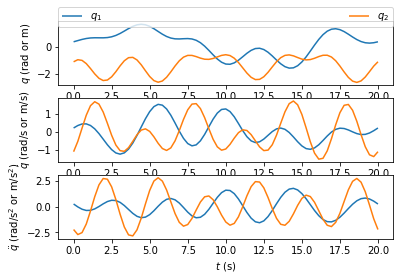

In [12]:
# %matplotlib qt 

traj_plotter = TrajPlotter(traj_optimizer.fourier_traj,traj_optimizer.frame_traj,
                           traj_optimizer.const_frame_ind)
traj_plotter.plot_desired_traj(traj_optimizer.x_result)

## save trajectory

In [13]:
from utils import save_data, load_data

trajectory_name = 'taimi5_2dof'
trajectory_folder =  'data/trajectories/'

dof_order_bf_x_norm = (traj_optimizer.fourier_traj.dof, fourier_order,
                       base_freq, traj_optimizer.x_result, [])
save_data(trajectory_folder, trajectory_name, dof_order_bf_x_norm)

freq = 50
tf = 20 # including 5 seconds' prestable time
traj_optimizer.make_traj_csv(trajectory_folder, trajectory_name, freq, tf)

trajectory_name = 'tmi5_2axis_train_x_result'
trajectory_folder =  'data/trajectories/'
traj_optimizer.make_x_result_csv(trajectory_folder,trajectory_name)

will make_x_result_csv


## display trajectory param

In [14]:
from IPython.display import HTML, display
import tabulate

table = []
table.append(["joint", 'qo'] +
             ["a"+str(i+1) for i in range(fourier_order)] +
             ["b"+str(i+1) for i in range(fourier_order)])
for i in range(traj_optimizer.fourier_traj.dof):
    line = []
    line.append(rbt.rbtdef.q[i])
    line += np.round(traj_optimizer.x_result[i*(1 + fourier_order*2): (i+1)*(1 + fourier_order*2)], 4).tolist()
    table.append(line)

display(HTML(tabulate.tabulate(table, tablefmt='html')))

joint,qo,a1,a2,a3,a4,a5,a6,b1,b2,b3,b4,b5,b6
q1,0.2857,0.2238,-0.199,-0.3362,0.1702,0.4014,0.0387,-0.2194,0.1626,0.1674,0.4625,-0.4821,0.1261
q2,-1.372,-0.0578,-0.1186,0.4604,-0.2032,0.0418,0.7702,0.0855,0.0504,0.2197,-0.2675,-0.3809,-0.8203


3 - Regression Data Processing
==============================

In [221]:
import os
import pickle
import math
import sympy
import numpy
import sympybotics

In [222]:
with open(tmpfolder +  'robotmodels/taimi5_2dof_mdh_model.pkl', 'rb' ) as file:
          rbt = pickle.load( file )

### Data Load
### Load traning data set

In [223]:
parms_traj = 'train'

In [224]:
from support_funcs.regr_data_proc import load_trajectory_data

training_results_data_file = datafolder +'recdata/' + 'tmi5_2axis_'+parms_traj+'_results.csv'

trajectory_sampling_rate = 125
t_raw, q_raw, dq_raw, tau_raw = load_trajectory_data(training_results_data_file,
                                                                   trajectory_sampling_rate)

(<type 'numpy.ndarray'>, (2442, 6))


In [225]:
### test Data Load
test_trajectory_name = 'test'

test_results_data_file = datafolder + 'recdata/' + 'ur3_2_'+test_trajectory_name + '_results.csv'
print(test_results_data_file)
trajectory_sampling_rate = 125
t_test, q_raw_test, dq_raw_test, tau_raw_test = load_trajectory_data(test_results_data_file,
                                                                trajectory_sampling_rate)

data/recdata/ur3_2_test_results.csv
(<type 'numpy.ndarray'>, (2477, 18))


### Some Plots

2


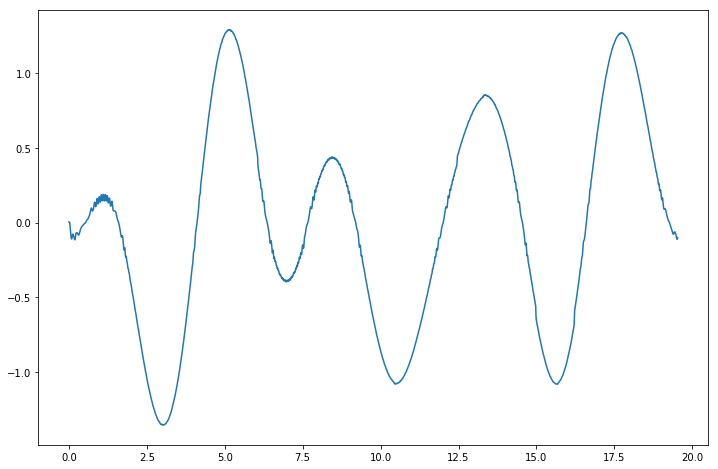

In [226]:
from matplotlib import pyplot as plt
plt.close()

# for d in range(rbt.dof):
#     co_num = str(d + 1)
#     plt.plot(t_raw, q_raw[:, d], label=(r"$q_" + co_num +"$"), linestyle= (0, ())
print(q_raw.shape[1])
#for i in range(dq_raw.shape[1]):
#    plt.plot(t_raw,dq_raw[:,i])
plt.plot(t_raw,dq_raw[:,1])
plt.show()

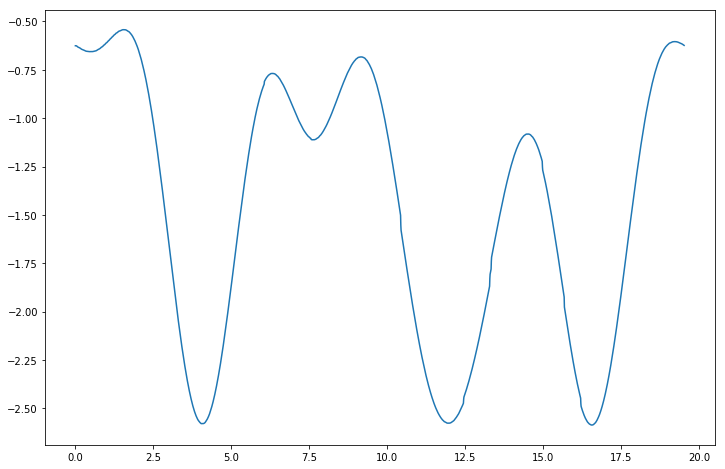

In [227]:
from matplotlib import pyplot as plt
plt.close()

joint = 2
# plt.plot(t_ref+0.20,q_ref[:,joint-1])
plt.plot(t_raw,q_raw[:,joint-1])

plt.show()

In [228]:
del t_raw, q_raw, dq_raw,tau_raw

### Parameter Load

In [229]:
from utils import save_data, load_data

training_trajectory_name = 'taimi5_2dof'


trajectory_folder = datafolder +'trajectories/'
dof, fourier_order, base_freq, traj_optimizer_result, reg_norm_mat = load_data(trajectory_folder,
                                                                               training_trajectory_name)
print("dof: {}".format(dof))
print("Fourier order: {}".format(fourier_order))
print("Base frequency: {}".format(base_freq))

dof: 2
Fourier order: 6
Base frequency: 0.05


### Filter Cut-off Frequency Definition

In [230]:
# times of the highest frequency in the Fourier series
fc_mult = 10.0

fc = base_freq * fourier_order * fc_mult
print("Cut frequency: {}".format(fc))

Cut frequency: 3.0


In [231]:
fc_q = fc
fc_dq = fc
fc_ddq = fc

fc_tau =  fc

si = 2000
sf = -2000

### Data Filtering, Differentiation and Regression Data Generation

In [232]:
#rec_h = 0.02#采样时间
rec_h = 0.008#采样时间

In [233]:
from support_funcs.regr_data_proc import load_trajectory_data, plot_trajectory_data, \
                                            diff_and_filt_data, gen_regr_matrices,diff_dqraw_and_filt_data


def process_regression_data(traj_name):
#     t_raw, q_raw, tau_raw, t_ref, q_ref = read_data(dof=rbt.dof, h=rec_h,
#                                                     rbtlogfile=datafolder + 'recdata/rbtlog_%s.dat'%traj_name,
#                                                     trajreffile=datafolder + 'trajectories/%s.dat'%traj_name)
    
    

    training_results_data_file = datafolder +'recdata/' + 'tmi5_2axis_%s_results.csv'%traj_name
    trajectory_sampling_rate = 125
    t_raw, q_raw, dq_raw, tau_raw = load_trajectory_data(training_results_data_file,
                                                                   trajectory_sampling_rate)
    
    #q, dq, ddq, tau = diff_and_filt_data(dof=rbt.dof, h=rec_h,  q_raw=q_raw, tau_raw=tau_raw,
    #                               fc_q=fc_q, fc_dq=fc_dq, fc_ddq=fc_ddq, fc_tau=fc_tau)
    
    q, dq, ddq, tau = diff_dqraw_and_filt_data(dof=rbt.dof, h=rec_h,  q_raw=q_raw, dq_raw=dq_raw, tau_raw=tau_raw,
                                   fc_q=fc_q, fc_dq=fc_dq, fc_ddq=fc_ddq, fc_tau=fc_tau) 
    
    t_raw = t_raw[si:sf]; q_raw = q_raw[si:sf];dq_raw = dq_raw[si:sf]; tau_raw = tau_raw[si:sf]
    q = q[si:sf]; dq = dq[si:sf]; ddq = ddq[si:sf]; tau = tau[si:sf]
    
    t_raw = t_raw - t_raw[0]
    
    t = numpy.array(range(q.shape[0])) * rec_h
    
    W, omega, Q1, R1, rho1 = gen_regr_matrices(rbt, q, dq, ddq, tau)
    
    return t_raw, q_raw, dq_raw,tau_raw, t, q, dq, ddq, tau, W, omega, Q1, R1, rho1

In [234]:
from support_funcs.utils import _fprint
from support_funcs.regr_data_proc import plot_trajectory_data
from matplotlib import pyplot as plt
plt.close()
for traj in ['train','test', 'traj2', 'traj3']:      #, 'traj4'
    _fprint('>>>>>>>> %s proc <<<<<<<<<'%traj)
    %time t_raw, q_raw, dq_raw,tau_raw, t, q, dq, ddq, tau, W, omega, Q1, R1, rho1 = process_regression_data(traj)
     
    #plt.plot(t,q[:,0])
    plt.plot(t,dq[:,0])
    #plt.plot(t,ddq[:,0])
    #plt.plot(t,dq_raw[:,1])
    #plt.plot(t,ddq[:,1])
    #plt.plot(t,dq[:,1])
    plt.plot(t,tau[:,0])
    plt.show()
    
    _fprint(' (cond=%f)'%numpy.linalg.cond(W))
    
    _fprint('%s save'%traj)
    _fprint('W is:')
    _fprint(W)
    print(type(W), W.shape)
    
    %time \
    numpy.savez_compressed(tmpfolder + 'procdata/' + traj + '_raw', t=t_raw, q=q_raw, tau=tau_raw);\
    numpy.savez_compressed(tmpfolder + 'procdata/' + traj + '_proc', t=t, q=q, dq=dq, ddq=ddq, tau=tau); \
    numpy.savez_compressed(tmpfolder + 'procdata/' + traj + '_regr', W=W, omega=omega, Q1=Q1, R1=R1, rho1=rho1)
    
    plot_trajectory_data(t, q_raw, q, dq, ddq,
                     tau_raw, tau)
    
    del t_raw, q_raw, tau_raw, t, q, dq, ddq, tau, W, omega, Q1, R1, rho1



>>>>>>>> train proc <<<<<<<<<
(<type 'numpy.ndarray'>, (2442, 6))


IndexError: index 0 is out of bounds for axis 0 with size 0

### Plot

In [235]:
#########train################
raw = numpy.load(tmpfolder + 'procdata/train_raw.npz')
tau_raw = raw['tau']
q_raw = raw['q']
del raw
proc = numpy.load(tmpfolder + 'procdata/train_proc.npz')
t = proc['t']
tau = proc['tau']
q = proc['q']
dq = proc['dq']
del proc

##################test##############
raw = numpy.load(tmpfolder + 'procdata/test_raw.npz')
tau_raw_test = raw['tau']
q_raw_test = raw['q']
del raw
proc = numpy.load(tmpfolder + 'procdata/test_proc.npz')
t_test = proc['t']
tau_test = proc['tau']
q_test = proc['q']
dq_test = proc['dq']
del proc

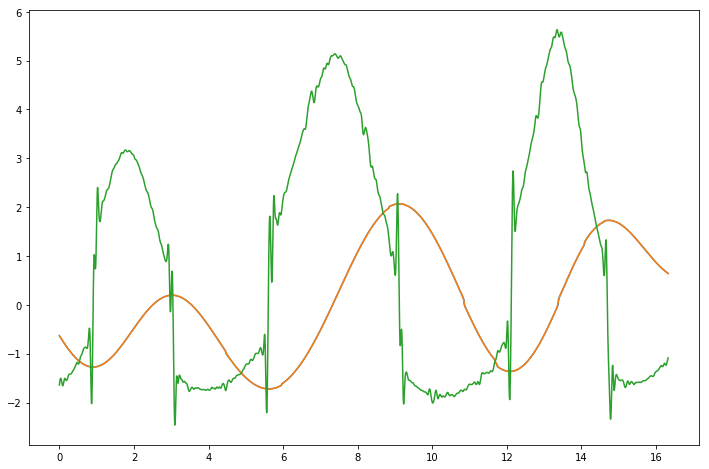

In [236]:
from matplotlib import pyplot as plt
plt.close()


####train##########
joint = 1
firsts = 20000
plt.plot(t[:firsts],q_raw[:,joint-1][:firsts])
plt.plot(t[:firsts],q[:,joint-1][:firsts])
#plt.plot(t[:firsts],dq[:,joint-1][:firsts])
#plt.plot(t[:firsts],tau_raw[:,joint-1][:firsts])
plt.plot(t[:firsts],tau[:,joint-1][:firsts])
plt.show()

###test#######
#plt.plot(t_test[:firsts],q_raw_test[:,joint-1][:firsts])
#plt.plot(t_test[:firsts],q_test[:,joint-1][:firsts])
#plt.plot(t[:firsts],dq[:,joint-1][:firsts])
#plt.plot(t_test[:firsts],tau_raw_test[:,joint-1][:firsts])

#plt.show()

In [237]:
del t, q, dq, tau, q_raw, tau_raw
del t_test, q_test, dq_test, tau_test, q_raw_test, tau_raw_test

4 - Dynamic Parameter Estimation
================================

In [238]:
import os
import pickle
import sympy
import numpy
import time

import sympybotics
import lmi_sdp

from lmi_sdp import init_lmi_latex_printing
init_lmi_latex_printing()

In [239]:
with open(tmpfolder +  'robotmodels/taimi5_2dof_mdh_model.pkl', 'rb' ) as file:
          rbt = pickle.load( file )

In [240]:
epsilon_safemargin = 1e-6
epsilon_sdptol = 1e-7

## LMI Matrix Definitions

In [241]:
dof = rbt.dof

delta = rbt.dyn.dynparms
n_delta = rbt.dyn.n_dynparms

beta = rbt.dyn.baseparms.n()
n_beta = rbt.dyn.n_base
beta_symbs = sympy.Matrix([sympy.Symbol('beta'+str(i+1),real=True) for i in range(n_beta)])

delta_d = (rbt.dyn.Pd.T*delta)
n_delta_d = len(delta_d)

Pb = rbt.dyn.Pb

varchange_dict = dict(zip(Pb.T*delta ,  beta_symbs - ( beta - Pb.T*delta )))

In [242]:
from support_funcs.utils import skew, mrepl
from sympy import BlockMatrix, Matrix, eye, Identity
I = Identity
S = skew

In [243]:
D_inertia_blocks = []
for i in range(dof):
    L = rbt.rbtdef.L[i]
    l = rbt.rbtdef.l[i]
    m = rbt.rbtdef.m[i]
    Di = BlockMatrix([[L,    S(l).T],
                      [S(l), I(3)*m]])
    D_inertia_blocks.append(Di.as_explicit())

In [244]:
D_inertia_blocks[0]

Matrix([
[L_1xx, L_1xy, L_1xz,     0,  l_1z, -l_1y],
[L_1xy, L_1yy, L_1yz, -l_1z,     0,  l_1x],
[L_1xz, L_1yz, L_1zz,  l_1y, -l_1x,     0],
[    0, -l_1z,  l_1y,   m_1,     0,     0],
[ l_1z,     0, -l_1x,     0,   m_1,     0],
[-l_1y,  l_1x,     0,     0,     0,   m_1]])

In [245]:
D_other_blocks = []
for i in range(dof):
    if rbt.rbtdef.driveinertiamodel == 'simplified':
        D_other_blocks.append( Matrix([rbt.rbtdef.Ia[i]]) )
    if 'viscous' in rbt.rbtdef.frictionmodel:
        D_other_blocks.append( Matrix([rbt.rbtdef.fv[i]]) )
    if 'Coulomb' in rbt.rbtdef.frictionmodel:
        D_other_blocks.append( Matrix([rbt.rbtdef.fc[i]]) )

D_other_blocks

[Matrix([[fv_1]]), Matrix([[fc_1]]), Matrix([[fv_2]]), Matrix([[fc_2]])]

In [246]:
D_blocks = D_inertia_blocks + D_other_blocks

In [247]:
D_blocks

[Matrix([
 [L_1xx, L_1xy, L_1xz,     0,  l_1z, -l_1y],
 [L_1xy, L_1yy, L_1yz, -l_1z,     0,  l_1x],
 [L_1xz, L_1yz, L_1zz,  l_1y, -l_1x,     0],
 [    0, -l_1z,  l_1y,   m_1,     0,     0],
 [ l_1z,     0, -l_1x,     0,   m_1,     0],
 [-l_1y,  l_1x,     0,     0,     0,   m_1]]), Matrix([
 [L_2xx, L_2xy, L_2xz,     0,  l_2z, -l_2y],
 [L_2xy, L_2yy, L_2yz, -l_2z,     0,  l_2x],
 [L_2xz, L_2yz, L_2zz,  l_2y, -l_2x,     0],
 [    0, -l_2z,  l_2y,   m_2,     0,     0],
 [ l_2z,     0, -l_2x,     0,   m_2,     0],
 [-l_2y,  l_2x,     0,     0,     0,   m_2]]), Matrix([[fv_1]]), Matrix([[fc_1]]), Matrix([[fv_2]]), Matrix([[fc_2]])]

## Change of Variable Space

In [248]:
varchange_dict = dict(zip(Pb.T*delta ,  beta_symbs - ( beta - Pb.T*delta )))

In [249]:
DB_blocks = [mrepl(Di, varchange_dict) for Di in D_blocks]
DB_blocks

[Matrix([
 [L_1xx, L_1xy,                                        L_1xz,     0,  l_1z, -l_1y],
 [L_1xy, L_1yy,                                        L_1yz, -l_1z,     0,  l_1x],
 [L_1xz, L_1yz, -L_2yy + beta1 - 0.385*l_2z - 0.03705625*m_2,  l_1y, -l_1x,     0],
 [    0, -l_1z,                                         l_1y,   m_1,     0,     0],
 [ l_1z,     0,                                        -l_1x,     0,   m_1,     0],
 [-l_1y,  l_1x,                                            0,     0,     0,   m_1]]),
 Matrix([
 [L_2yy + beta4, beta5,  beta6,      0,   l_2z, -beta10],
 [        beta5, L_2yy,  beta7,  -l_2z,      0,   beta9],
 [        beta6, beta7,  beta8, beta10, -beta9,       0],
 [            0, -l_2z, beta10,    m_2,      0,       0],
 [         l_2z,     0, -beta9,      0,    m_2,       0],
 [      -beta10, beta9,      0,      0,      0,     m_2]]),
 Matrix([[beta2]]),
 Matrix([[beta3]]),
 Matrix([[beta11]]),
 Matrix([[beta12]])]

## LMI Definitions

In [250]:
from lmi_sdp import LMI_PD, LMI

In [251]:
DB_LMIs = list(map(LMI_PD, DB_blocks))

In [252]:
DB_LMIs[0]

Matrix([
[L_1xx, L_1xy,                                        L_1xz,     0,  l_1z, -l_1y],
[L_1xy, L_1yy,                                        L_1yz, -l_1z,     0,  l_1x],
[L_1xz, L_1yz, -L_2yy + beta1 - 0.385*l_2z - 0.03705625*m_2,  l_1y, -l_1x,     0],
[    0, -l_1z,                                         l_1y,   m_1,     0,     0],
[ l_1z,     0,                                        -l_1x,     0,   m_1,     0],
[-l_1y,  l_1x,                                            0,     0,     0,   m_1]]) > 0

In [253]:
DB_LMIs_marg = list(map(lambda lm: LMI(lm, epsilon_safemargin*eye(lm.shape[0])) , DB_blocks))

In [254]:
DB_LMIs_marg[0]

Matrix([
[L_1xx, L_1xy,                                        L_1xz,     0,  l_1z, -l_1y],
[L_1xy, L_1yy,                                        L_1yz, -l_1z,     0,  l_1x],
[L_1xz, L_1yz, -L_2yy + beta1 - 0.385*l_2z - 0.03705625*m_2,  l_1y, -l_1x,     0],
[    0, -l_1z,                                         l_1y,   m_1,     0,     0],
[ l_1z,     0,                                        -l_1x,     0,   m_1,     0],
[-l_1y,  l_1x,                                            0,     0,     0,   m_1]]) >= Matrix([
[1.0e-6,      0,      0,      0,      0,      0],
[     0, 1.0e-6,      0,      0,      0,      0],
[     0,      0, 1.0e-6,      0,      0,      0],
[     0,      0,      0, 1.0e-6,      0,      0],
[     0,      0,      0,      0, 1.0e-6,      0],
[     0,      0,      0,      0,      0, 1.0e-6]])

In [255]:
DB_LMIs_marg[0].canonical()

Matrix([
[L_1xx - 1.0e-6,          L_1xy,                                                 L_1xz,            0,         l_1z,        -l_1y],
[         L_1xy, L_1yy - 1.0e-6,                                                 L_1yz,        -l_1z,            0,         l_1x],
[         L_1xz,          L_1yz, -L_2yy + beta1 - 0.385*l_2z - 0.03705625*m_2 - 1.0e-6,         l_1y,        -l_1x,            0],
[             0,          -l_1z,                                                  l_1y, m_1 - 1.0e-6,            0,            0],
[          l_1z,              0,                                                 -l_1x,            0, m_1 - 1.0e-6,            0],
[         -l_1y,           l_1x,                                                     0,            0,            0, m_1 - 1.0e-6]]) >= 0

## SDP Solver Interfaces

### [SDPA](http://sdpa.sourceforge.net/)

In [256]:
def sdpa(objf, lmis, variables):
    sdpadat = lmi_sdp.to_sdpa_sparse(objf, lmis, variables)
    with open(tmpfolder + 'sdpa_dat/sdp.dat-s', 'w') as f:
        f.write(sdpadat)
    
    stdout = !sdpa -ds "$tmpfolder"sdpa_dat/sdp.dat-s -o "$tmpfolder"sdpa_dat/sdpa.out -p "$tmpfolder"sdpa_dat/param.sdpa -pt 2
    print('\n'.join(stdout))

    outfile = !cat "$tmpfolder"sdpa_dat/sdpa.out
    sol = [float(v) for v in outfile[outfile.index('xVec = ') + 1].replace('{', '').replace('}', '').split(',')]
    return numpy.matrix(sol).T

### [CSDP](https://projects.coin-or.org/Csdp/)

In [257]:
def csdp(objf, lmis, variables):
    sdpadat = lmi_sdp.to_sdpa_sparse(objf, lmis, variables)
    with open(tmpfolder + 'sdpa_dat/sdp.dat-s', 'w') as f:
        f.write(sdpadat)
    
    stdout = !cd "$tmpfolder"sdpa_dat; csdp sdp.dat-s csdp.out
    print('\n'.join(stdout))

    outfile = !cat "$tmpfolder"sdpa_dat/csdp.out
    sol = [float(v) for v in outfile[0].split()]
    return numpy.matrix(sol).T

### [DSDP5](doi.org/10.1145/1356052.1356057)

In [258]:
def dsdp5(objf, lmis, variables):
    sdpadat = lmi_sdp.to_sdpa_sparse(objf, lmis, variables)
    with open(tmpfolder + 'sdpa_dat/sdp.dat-s', 'w') as f:
        f.write(sdpadat)
    
    stdout = !cd "$tmpfolder"sdpa_dat; dsdp5 sdp.dat-s -save dsdp5.out -gaptol $epsilon_sdptol
    print('\n'.join(stdout))

    outfile = !cat "$tmpfolder"sdpa_dat/dsdp5.out
    sol = [float(v) for v in outfile[0].split()]
    return numpy.matrix(sol).T

### [DSDP5 through CVXOPT](http://abel.ee.ucla.edu/cvxopt/userguide/coneprog.html#cvxopt.solvers.sdp)

In [259]:
def cvxopt_dsdp5(objf, lmis, variables):
    import cvxopt.solvers
    c, Gs, hs = lmi_sdp.to_cvxopt(objf, lmis, variables)
    cvxopt.solvers.options['DSDP_GapTolerance'] = epsilon_sdptol
    tic = time.time()
    sdpout = cvxopt.solvers.sdp(c, Gs=Gs, hs=hs, solver='dsdp')
    toc = time.time()
    print(sdpout['status'], ('ATT!: \'optimal\' does not necessarlly means feasible'))
    print('Elapsed time: %.2f s'%(toc-tic))
    return numpy.matrix(sdpout['x'])

### [CVXOPT CONELP](http://abel.ee.ucla.edu/cvxopt/userguide/coneprog.html#cvxopt.solvers.sdp)

In [260]:
def cvxopt_conelp(objf, lmis, variables):
    import cvxopt.solvers
    c, Gs, hs = lmi_sdp.to_cvxopt(objf, lmis, variables)
    cvxopt.solvers.options['feastol'] = epsilon_sdptol
    tic = time.time()
    sdpout = cvxopt.solvers.sdp(c, Gs=Gs, hs=hs)
    toc = time.time()
    print(sdpout['status'])
    print('Elapsed time: %.2f s'%(toc-tic))
    return numpy.matrix(sdpout['x'])

### [Raw SDPA file](http://plato.asu.edu/ftp/sdpa_format.txt)

Can be solved online with a *Semidefinite Programming* solver at [NEOS Solvers](http://www.neos-server.org/neos/solvers/index.html)

In [261]:
def sdpa_file(objf, lmis, variables):
    sdpadat = lmi_sdp.to_sdpa_sparse(objf, lmis, variables)
    with open(tmpfolder + 'sdpa_dat/sdpa_input.dat-s', 'w') as f:
        f.write(sdpadat)
        
    print("SDPA file saved at: %ssdpa_dat/sdpa_input.dat-s"%tmpfolder)

--------------

Setting the default SDP solver:

In [262]:
solve_sdp = dsdp5

## OLS Regression ($\hat{\beta}$)

In [263]:
indentification_traj = 'train'

In [264]:
regr_mats = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_regr.npz')
W = numpy.matrix(regr_mats['W'])
omega = numpy.matrix(regr_mats['omega'])
R1 = numpy.matrix(regr_mats['R1'])
rho1 = numpy.matrix(regr_mats['rho1'])

In [265]:
omega.shape[0] / rbt.dof

2042

In [266]:
W.shape

(4084, 12)

In [267]:
numpy.linalg.cond(W)

24.71387444674554

In [268]:
%time beta_ols = (R1.T * R1).I * R1.T * rho1
print('beta_ols')
print(beta_ols)

CPU times: user 13.4 ms, sys: 7.14 ms, total: 20.5 ms
Wall time: 4.6 ms
beta_ols
[[ 0.38783424]
 [ 1.81660771]
 [ 0.58243658]
 [-0.1252854 ]
 [ 0.10504332]
 [-0.03299782]
 [ 0.161521  ]
 [ 0.60195727]
 [-0.0540955 ]
 [ 0.03017416]
 [ 1.5387181 ]
 [ 0.79266535]]


In [269]:
numpy.savetxt(tmpfolder + 'solutions/' + indentification_traj + '_beta_ols.dat', beta_ols)

In [270]:
rho2_norm_sqr = numpy.linalg.norm(omega - W * beta_ols)**2
print(rho2_norm_sqr)

1835.0175833549038


### plot measured and predicted torque

beta_ols is:
[[0.]]


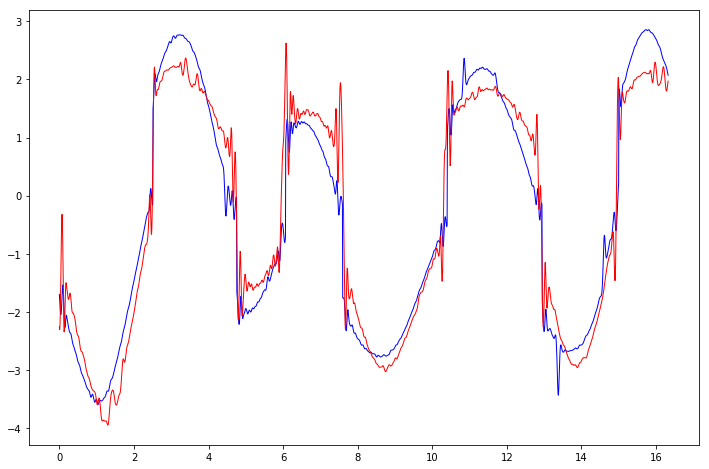

In [272]:
from support_funcs.regr_data_proc import  plot_meas_pred_tau

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']
print('beta_ols is:')
print(beta_ols[8])
beta_ols[8] = 0
tau_p = np.zeros(tau.shape)
tau_ps = W.dot(beta_ols)
for i in range(dof):
    tau_p[:, i] = tau_ps[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 125
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
#plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],
#                  tau_p[:plot_data_num, :])

plt.plot(t, tau_p[:, 1], 'b', label="Predicted", linewidth=1)
plt.plot(t, tau[:, 1], 'r', label="Measure", linewidth=1)

In [109]:
####################Compare measured torque and predicted torque on the test set############
from support_funcs.regr_data_proc import  plot_meas_pred_tau
import matplotlib.pyplot as plt
indentification_traj = 'test'

regr_mats_test = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_regr.npz')
W_test = numpy.matrix(regr_mats_test['W'])
omega_test = numpy.matrix(regr_mats_test['omega'])
R1_test = numpy.matrix(regr_mats_test['R1'])
rho1_test = numpy.matrix(regr_mats_test['rho1'])
numpy.linalg.cond(W_test)




plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t_test = proc['t']
tau_test = proc['tau']
tau_p_test = np.zeros(tau_test.shape)
tau_ps_test = W_test.dot(beta_ols)
print('beta_ols')
print(beta_ols)
for i in range(dof):
    tau_p_test[:, i] = tau_ps_test[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 125
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
plot_meas_pred_tau(t_test[:plot_data_num], tau_test[:plot_data_num, :],
                   tau_p_test[:plot_data_num, :])





ValueError: shapes (12462,48) and (12,1) not aligned: 48 (dim 1) != 12 (dim 0)

## Weighted Least Square (WLS)

In [163]:
proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']

weight = np.max(tau, axis=0) - np.min(tau, axis=0)#axis默认为axis=0即列向,
print("weight: ")
print(weight)

temp1 =np.max(tau, axis=0)
print(temp1)
temp2 = np.min(tau, axis=0)
print(temp2)


# repeat the weight to generate a large vecoter for all the data
weights = 1.0/np.tile(weight, W.shape[0]/weight.shape[0])
print('weights :')
print(weights)
print('weights len:')
print(len(weights))

weight: 
[8.09359251 6.57376766]
[5.63319932 2.62512676]
[-2.46039319 -3.9486409 ]
weights :
[0.12355453 0.15211977 0.12355453 ... 0.15211977 0.12355453 0.15211977]
weights len:
12462


In [90]:
weights[0:2]

array([0.12355453, 0.15211977])

In [91]:
W_wls = np.multiply(W, np.asmatrix(weights).transpose())
omega_wls = np.multiply(omega.T, weights).T
Q1_wls,R1_wls = numpy.linalg.qr(W_wls)
rho1_wls = Q1_wls.T*omega_wls

In [92]:
%time beta_wls = (R1_wls.T * R1_wls).I * R1_wls.T * rho1_wls

CPU times: user 0 ns, sys: 2.47 ms, total: 2.47 ms
Wall time: 630 µs


In [93]:
numpy.savetxt(tmpfolder + 'solutions/' + indentification_traj + '_beta_wls.dat', beta_wls)

In [95]:
rho2_norm_sqr_wls = numpy.linalg.norm(omega_wls - W_wls * beta_wls)**2

### plot measured and predicted torque

beta_wls is:
[[ 0.36820068]
 [ 1.82330812]
 [ 0.5747155 ]
 [-0.09708986]
 [ 0.08293621]
 [-0.02303348]
 [ 0.11713493]
 [ 0.57455848]
 [-0.04828762]
 [ 0.0313323 ]
 [ 1.53382021]
 [ 0.79861858]]


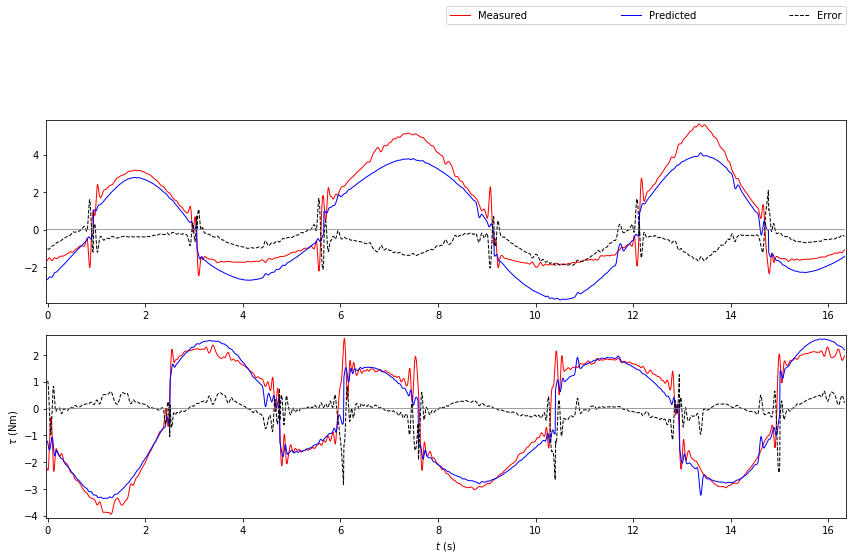

In [96]:
from support_funcs.regr_data_proc import  plot_meas_pred_tau

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']

tau_p = np.zeros(tau.shape)
print('beta_wls is:')
print(beta_wls)
tau_ps = W.dot(beta_wls)
for i in range(dof):
    tau_p[:, i] = tau_ps[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 125
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],
                   tau_p[:plot_data_num, :])

### Base Parameter Feasibility Test (BPFT) of OLS Solution

In [97]:
dict_subs = dict(zip(beta_symbs, beta_wls.flatten().tolist()[0]))
lmis_ols_bpft = [ lmi_sdp.LMI_PD(mrepl(lmi.canonical().gts, dict_subs)) for lmi in DB_LMIs ]

In [98]:
lmis_ols_bpft[0]

Matrix([
[L_1xx, L_1xy,                                                    L_1xz,     0,  l_1z, -l_1y],
[L_1xy, L_1yy,                                                    L_1yz, -l_1z,     0,  l_1x],
[L_1xz, L_1yz, -L_2yy - 0.385*l_2z - 0.03705625*m_2 + 0.368200676727931,  l_1y, -l_1x,     0],
[    0, -l_1z,                                                     l_1y,   m_1,     0,     0],
[ l_1z,     0,                                                    -l_1x,     0,   m_1,     0],
[-l_1y,  l_1x,                                                        0,     0,     0,   m_1]]) > 0

In [99]:
variables_ols_bpft = list(delta_d)
objf_ols_bpft = 0  # no objective function - "find" problem

Testing with all solvers

**Just one of the following calls is sufficient to show feasibility/infeasibility**

In [100]:
sol = sdpa_file(objf_ols_bpft, lmis_ols_bpft, variables_ols_bpft) # One can solve the output file at http://www.neos-server.org/neos/solvers/sdp:DSDP/SDPA.html for example.

SDPA file saved at: tmp/sdpa_dat/sdpa_input.dat-s


In [101]:
sol = dsdp5(objf_ols_bpft, lmis_ols_bpft, variables_ols_bpft)

/bin/bash: dsdp5: command not found


In [102]:
sol = sdpa(objf_ols_bpft, lmis_ols_bpft, variables_ols_bpft)

/bin/bash: sdpa: command not found


In [103]:
sol = csdp(objf_ols_bpft, lmis_ols_bpft, variables_ols_bpft)

/bin/bash: csdp: command not found


ValueError: could not convert string to float: cat:

In [104]:
sol = cvxopt_conelp(objf_ols_bpft, lmis_ols_bpft, variables_ols_bpft)

     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -5.5761e+00  2e+01  2e+00  5e+00  1e+00
 1:  0.0000e+00 -3.0807e-01  9e-01  1e-01  4e-01  3e-01
 2:  0.0000e+00 -1.5074e-02  3e-02  5e-03  1e-02  6e-03
 3:  0.0000e+00 -1.4917e-04  3e-04  5e-05  1e-04  6e-05
 4:  0.0000e+00 -1.4914e-06  3e-06  5e-07  1e-06  6e-07
 5:  0.0000e+00 -1.4914e-08  3e-08  5e-09  1e-08  6e-09
Optimal solution found.
optimal
Elapsed time: 0.02 s


## Base Parameter Feasibility Correction (BPFC)     ($\beta^\prime$)

In [105]:
u = sympy.Symbol('u')
U_beta = BlockMatrix([[Matrix([u]),            (beta_wls - beta_symbs).T],
                 [beta_wls - beta_symbs,                 I(n_beta)]])
U_beta = U_beta.as_explicit()

In [106]:
lmis_ols_bpfc = [LMI(U_beta)] + DB_LMIs_marg

In [107]:
lmis_ols_bpfc[1]

Matrix([
[L_1xx, L_1xy,                                        L_1xz,     0,  l_1z, -l_1y],
[L_1xy, L_1yy,                                        L_1yz, -l_1z,     0,  l_1x],
[L_1xz, L_1yz, -L_2yy + beta1 - 0.385*l_2z - 0.03705625*m_2,  l_1y, -l_1x,     0],
[    0, -l_1z,                                         l_1y,   m_1,     0,     0],
[ l_1z,     0,                                        -l_1x,     0,   m_1,     0],
[-l_1y,  l_1x,                                            0,     0,     0,   m_1]]) >= Matrix([
[1.0e-6,      0,      0,      0,      0,      0],
[     0, 1.0e-6,      0,      0,      0,      0],
[     0,      0, 1.0e-6,      0,      0,      0],
[     0,      0,      0, 1.0e-6,      0,      0],
[     0,      0,      0,      0, 1.0e-6,      0],
[     0,      0,      0,      0,      0, 1.0e-6]])

In [108]:
variables_ols_bpfc = [u] + list(beta_symbs) + list(delta_d)

In [109]:
objf_ols_bpfc = u

In [110]:
sol_ols_bpfc = solve_sdp(objf_ols_bpfc, lmis_ols_bpfc, variables_ols_bpfc)

/bin/bash: dsdp5: command not found


In [111]:
u_prime = sol_ols_bpfc[0,0]
beta_prime = sol_ols_bpfc[1:1+n_beta]
delta_d_prime = sol_ols_bpfc[1+n_beta:]

In [112]:
u_prime

84.15816540910578

### plot measured and predicted torque

[[10.10145361]
 [-5.45768539]
 [-0.20847279]
 [ 0.71759653]
 [-0.05492771]
 [ 6.13846374]
 [11.80332778]
 [ 0.01358675]
 [-3.20487027]
 [ 0.35261523]
 [-0.69900501]
 [ 0.03331135]]


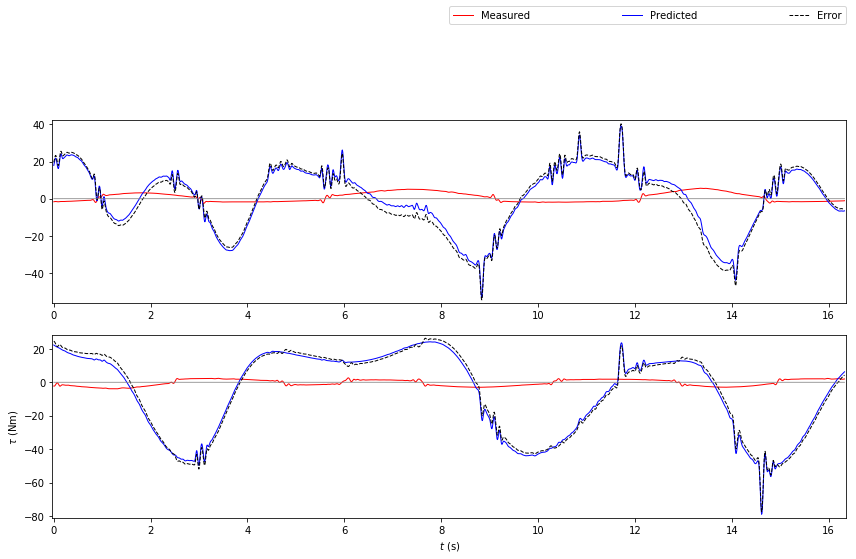

In [114]:
# from support_funcs.regr_data_proc import  plot_meas_pred_tau

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']

tau_p = np.zeros(tau.shape)
#print('beta_prime')
print(beta_prime)
tau_ps = W.dot(beta_prime)
for i in range(dof):
    tau_p[:, i] = tau_ps[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 125
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],
                   tau_p[:plot_data_num, :])
#plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],tau[:plot_data_num, :])
                   


### Solution Double Check

In [115]:
dict_subs = dict(zip(beta_symbs, beta_prime.flatten().tolist()[0]))
dict_subs.update(dict(zip(delta_d, delta_d_prime.flatten().tolist()[0])))

test = 'ok'
for i, DBi in enumerate(DB_blocks):
        m = numpy.matrix(mrepl(DBi, dict_subs)).astype(float)
        for v in numpy.linalg.eigvals( m ):
            if v <= 0.0:
                print i, v
                test = 'fail'
print(test)

0 -5.161904758131335
0 -0.008727130399180149
1 -14.220622919176241
1 -1.3332861610653457
2 -5.4576853874433064
3 -0.20847279333561752
4 -0.6990050104967216
fail


In [116]:
numpy.savetxt(tmpfolder + 'solutions/' + indentification_traj + '_beta_prime.dat', beta_prime)

## Feasible Base Parameter Estimation with Weight Least Squares (FBPE-WLS)     ($\beta^\star$)

In [117]:
u = sympy.Symbol('u')
U_rho = BlockMatrix([[Matrix([u - rho2_norm_sqr_wls]), (rho1_wls - R1_wls*beta_symbs).T],
                     [rho1_wls - R1_wls*beta_symbs,                       I(n_beta)]])
U_rho = U_rho.as_explicit()

In [118]:
lmis_fbpe_ols = [LMI(U_rho)] + DB_LMIs_marg

In [119]:
variables_fbpe_ols = [u] + list(beta_symbs) + list(delta_d)

In [120]:
objf_fbpe_ols = u

In [121]:
sol_fbpe_ols = solve_sdp(objf_fbpe_ols, lmis_fbpe_ols, variables_fbpe_ols)

/bin/bash: dsdp5: command not found


In [122]:
u_star = sol_fbpe_ols[0,0]
beta_star = numpy.matrix(sol_fbpe_ols[1:1+n_beta])
delta_d_star = numpy.matrix(sol_fbpe_ols[1+n_beta:])

In [123]:
u_star

84.15816540910578

### plot measured and predicted torque

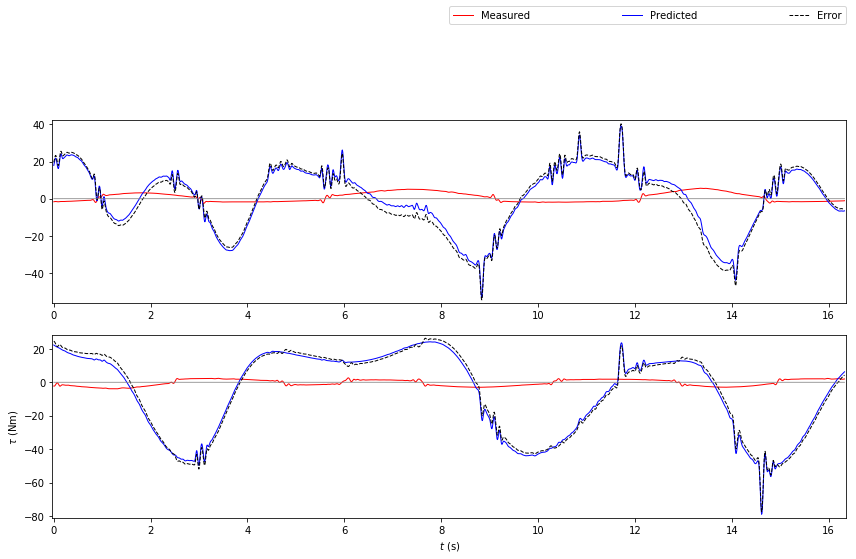

In [124]:
# from support_funcs.regr_data_proc import  plot_meas_pred_tau

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']

tau_p = np.zeros(tau.shape)
tau_ps = W.dot(beta_star)
for i in range(dof):
    tau_p[:, i] = tau_ps[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 125
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],
                   tau_p[:plot_data_num, :])

### Solution Double Check

In [125]:
dict_subs = dict(zip(beta_symbs, beta_star.flatten().tolist()[0]))
dict_subs.update(dict(zip(delta_d, delta_d_star.flatten().tolist()[0])))

test = 'ok'
for DBi in DB_blocks:
        m = numpy.matrix(mrepl(DBi, dict_subs)).astype(float)
        for v in numpy.linalg.eigvals( m ):
            if v <= 0.0:
                print(v)
                test = 'fail'
print(test)

-5.161904758131335
-0.008727130399180149
-14.220622919176241
-1.3332861610653457
-5.4576853874433064
-0.20847279333561752
-0.6990050104967216
fail


In [126]:
numpy.savetxt(tmpfolder + 'solutions/' + indentification_traj + '_beta_star.dat', beta_star)

## Additional Constraints on Centers-of-Mass    ($\beta^{\star e}$)

In [127]:
link_cuboid_hulls = [
[[ -0.10 , +0.10 ],[ -0.10 , +0.10 ],[ -0.10 , +0.10 ]],
[[ -0.10 , +0.70 ],[ -0.10 , +0.10 ],[ -0.10 , +0.10 ]],
[[ -0.10 , +0.60 ],[ -0.10 , +0.10 ],[ -0.10 , +0.10 ]],
[[ -0.10 , +0.10 ],[ -0.10 , +0.10 ],[ -0.10 , +0.10 ]],
[[ -0.10 , +0.10 ],[ -0.10 , +0.10 ],[ -0.10 , +0.10 ]],
[[ -0.05 , +0.05 ],[ -0.05 , +0.05 ],[ -0.05 , +0.05 ]],
]

robotmaxmass = 27.0

#### LMI Matrix Definition

In [128]:
D_add_blocks = []
for i in range(rbt.dof):
    l = rbt.rbtdef.l[i]
    m = rbt.rbtdef.m[i]
    link_cuboid_hull = link_cuboid_hulls[i]
    for j in range(3):
        D_add_blocks.append( Matrix( [[  l[j] - m*link_cuboid_hull[j][0] ]] ) )
        D_add_blocks.append( Matrix( [[ -l[j] + m*link_cuboid_hull[j][1] ]] ) )

D_add_blocks.append(Matrix([robotmaxmass - sum(rbt.rbtdef.m)]))

#### Variable Change and LMI Definition

In [129]:
DB_add_blocks = [ mrepl(Di, varchange_dict) for Di in D_add_blocks ]

In [130]:
DB_add_LMIs = list(map(LMI_PD, DB_add_blocks))

In [131]:
DB_add_LMIs_marg = list(map(lambda lm: LMI(lm, epsilon_safemargin*eye(lm.shape[0])) , DB_add_blocks))

In [132]:
DB_add_LMIs_marg[0]

Matrix([[l_1x + 0.1*m_1]]) >= Matrix([[1.0e-6]])

In [133]:
DB_add_LMIs_marg[-1]

Matrix([[-m_1 - m_2 + 27.0]]) >= Matrix([[1.0e-6]])

### Testing $\beta^\star$ solution on new constraints

In [134]:
dict_subs = dict(zip(beta_symbs, beta_star.flatten().tolist()[0]))
lmis_star_bpft_add = [ lmi_sdp.LMI_PD(mrepl(lmi.canonical().gts, dict_subs)) for lmi in DB_add_LMIs_marg ]
variables_star_bpft_add = list(delta_d)
objf_star_bpft_add = delta_d[0]

In [135]:
sol_star_bpft_add = solve_sdp(objf_star_bpft_add, lmis_star_bpft_add, variables_star_bpft_add)

/bin/bash: dsdp5: command not found


### Finding new solution

In [136]:
lmis_fbpe_ols_add = [LMI(U_rho)] + DB_LMIs_marg + DB_add_LMIs_marg

In [137]:
variables_fbpe_ols_add = [u] + list(beta_symbs) + list(delta_d)

In [138]:
objf_fbpe_ols_add = u

In [139]:
sol_fbpe_ols_add = solve_sdp(objf_fbpe_ols_add, lmis_fbpe_ols_add, variables_fbpe_ols_add)

/bin/bash: dsdp5: command not found


In [140]:
u_starextra = sol_fbpe_ols_add[0,0]
beta_starextra = numpy.matrix(sol_fbpe_ols_add[1:1+n_beta])
delta_d_starextra = numpy.matrix(sol_fbpe_ols_add[1+n_beta:])

In [141]:
u_starextra

84.15816540910578

### Solution Double Check

In [142]:
dict_subs = dict(zip(beta_symbs, beta_starextra.flatten().tolist()[0]))
dict_subs.update(dict(zip(delta_d, delta_d_starextra.flatten().tolist()[0])))

test = 'ok'
for DBi in (DB_blocks + DB_add_blocks):
        m = numpy.matrix(mrepl(DBi, dict_subs)).astype(float)
        for v in numpy.linalg.eigvals( m ):
            if v <= 0.0: test = 'fail'
print(test)

fail


In [143]:
numpy.savetxt(tmpfolder + 'solutions/' + indentification_traj + '_beta_starextra.dat', beta_starextra)

### Inertia Matrix Definiteness Tests

In [144]:
def test_mass_matrix_psd(beta_solution):
    K = rbt.dyn.Pb.T + rbt.dyn.Kd * rbt.dyn.Pd.T
    A = numpy.matrix(K).astype(float)
    b = numpy.matrix(beta_solution).astype(float)
    x = numpy.linalg.pinv(A) * b
    d_test = x
    
    M_func_def = sympybotics.robotcodegen.robot_code_to_func( 'python', rbt.M_code, 'M', 'M_func', rbt.rbtdef)
    exec(M_func_def, globals())
    global sin, cos
    from math import sin, cos
    
    ntests = 10000
    
    ok = 0
    nok = 0
    for i in range(ntests):
        q_test = numpy.random.rand(rbt.dof)
        M_out = M_func( numpy.array(d_test).flatten().tolist(), q_test)
        M = numpy.matrix(M_out).reshape((rbt.dof,rbt.dof))
        try:
            c = numpy.linalg.cholesky(M)
        except:
            nok += 1
            continue
        ok += 1
        
    print 'ok     %8i  %3i%%'%(ok, 100.0*ok/ntests) 
    print 'not ok %8i  %3i%%'%(nok, 100.0*nok/ntests)
    if nok > 0 :
        print('\nNot PSD -> Not feasible!')
    else:
        print('\nSeems feasible.')

In [145]:
beta_ols = numpy.matrix(numpy.loadtxt(tmpfolder + 'solutions/traj1_beta_ols.dat')).T
test_mass_matrix_psd(beta_ols)

ValueError: shapes (24,12) and (48,1) not aligned: 12 (dim 1) != 48 (dim 0)

In [146]:
beta_wls = numpy.matrix(numpy.loadtxt(tmpfolder + 'solutions/traj1_beta_wls.dat')).T
test_mass_matrix_psd(beta_wls)

ValueError: shapes (24,12) and (48,1) not aligned: 12 (dim 1) != 48 (dim 0)

In [147]:
beta_prime = numpy.matrix(numpy.loadtxt(tmpfolder + 'solutions/traj1_beta_prime.dat')).T
test_mass_matrix_psd(beta_prime)

ValueError: shapes (24,12) and (36,1) not aligned: 12 (dim 1) != 36 (dim 0)

In [148]:
beta_star = numpy.matrix(numpy.loadtxt(tmpfolder + 'solutions/traj1_beta_star.dat')).T
test_mass_matrix_psd(beta_star)

ValueError: shapes (24,12) and (48,1) not aligned: 12 (dim 1) != 48 (dim 0)

In [149]:
beta_starextra = numpy.matrix(numpy.loadtxt(tmpfolder + 'solutions/traj1_beta_starextra.dat')).T
test_mass_matrix_psd(beta_starextra)

ValueError: shapes (24,12) and (48,1) not aligned: 12 (dim 1) != 48 (dim 0)

5 - Regression Model Validation
====================================================

In [150]:
import numpy as np
import sympybotics
import pickle

from collections import OrderedDict
from support_funcs.utils import ListTable

In [151]:
with open(tmpfolder +  'robotmodels/ur3_mdh_model.pkl', 'rb' ) as file:
          rbt = pickle.load( file )

In [152]:
def analyse(W, omega, R1, beta):
    from numpy import matrix, mean
    from numpy.linalg import cond, norm
    
    p = dict()
    
    n = W.shape[0]
    
    omega_norm = norm(omega)
    omega_mean = mean(omega)
    
    p['err'] = norm(omega - W * beta)
    p['merr'] = p['err'] / n
    
    p['se'] = p['err']**2
    p['mse'] = p['se']/(n-W.shape[1])
    p['rmse'] = p['mse']**0.5
    
    C = p['mse'] * (R1.T * R1).I
    p['sd'] = np.sqrt(C.diagonal()).T
    p['sd%'] = 100. * p['sd'] / np.abs(beta)
    
    p['relerr'] = p['err']/ omega_norm
    p['relerr%'] = p['relerr']*100.
    
    p['1-r2'] = p['err']**2 / norm(omega - omega_mean)**2
    p['r2'] = 1 - p['1-r2']

    return p
    

In [153]:
# trajs = OrderedDict([('id', 'traj1'),
#                      ('vA', 'traj2'),
#                      ('vB', 'traj3'),
#                      ('vC', 'traj4')])

trajs = OrderedDict([('id', 'traj1'),
                     ('vA', 'traj2'),
                     ('vB', 'traj3')])

betas = OrderedDict([('beta_ols', 'B^'),
                     ('beta_wls', 'B~'),
                     ('beta_prime', 'B\''),
                     ('beta_star', 'B*'),
                     ('beta_starextra', 'B*e')])

In [154]:
solutions_beta = {betaname:np.matrix(np.loadtxt(tmpfolder + 'solutions/%s_%s.dat'%(trajs['id'], betaname))).T for betaname in betas}

In [155]:
analysis = dict()

for traj in trajs:
    from numpy.linalg import cond
    
    print(traj)
    
    analysis[traj] = dict()
    
    regr_mats = np.load(tmpfolder + 'procdata/' + trajs[traj] + '_regr.npz')
    W = np.matrix(regr_mats['W'])
    omega = np.matrix(regr_mats['omega'])
    R1 = np.matrix(regr_mats['R1'])
    
    analysis[traj]['cond'] = cond(W)
    
    analysis[traj]['betas'] = dict()
    
    for betaname in betas:
        beta = solutions_beta[betaname]
        analysis[traj]['betas'][betaname] = analyse(W, omega, R1, beta)
    
    del W, omega, R1

id


ValueError: shapes (12462,48) and (36,1) not aligned: 48 (dim 1) != 36 (dim 0)

In [156]:
prop = lambda x: x['relerr%']
form = '%.2f'

table = ListTable()
table.append([''] + ['cond'] + betas.values())
for (traj, trajname) in zip(trajs, ['identification', 'validation A', 'validation B', 'validation C']):
    row = [traj] + ['%.0f'%analysis[traj]['cond']] + [ form%prop(analysis[traj]['betas'][b]) for b in betas]
    table.append(row)
table

KeyError: 'beta_prime'

In [178]:
import yaml, sympy
with open(datafolder + 'robotparams/ur10_cad.yml', 'r') as f:
    ur10_cad = yaml.load(f)
delta_cad = sympy.Matrix([ur10_cad.get(str(d), d) for d in rbt.dyn.dynparms])
beta_cad = (rbt.dyn.Pb.T + rbt.dyn.Kd * rbt.dyn.Pd.T) * delta_cad

/home/mi/venv27/lib/python2.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


### plot measured and predicted torque

In [179]:
indentification_traj = 'traj1'
regr_mats = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_regr.npz')
W = numpy.matrix(regr_mats['W'])

In [180]:
# from support_funcs.regr_data_proc import  plot_meas_pred_tau

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12,8]

proc = numpy.load(tmpfolder + 'procdata/' + indentification_traj + '_proc.npz')
t = proc['t']
tau = proc['tau']

tau_p = np.zeros(tau.shape)
tau_ps = W.dot(numpy.matrix(beta_cad))
for i in range(dof):
    tau_p[:, i] = tau_ps[i::dof].flatten()

base_freq = 0.05    
trajectory_sampling_rate = 50
plot_data_num = int(1 / base_freq * trajectory_sampling_rate)
plot_meas_pred_tau(t[:plot_data_num], tau[:plot_data_num, :],
                   tau_p[:plot_data_num, :])

TypeError: can't convert expression to float

### $\beta^{cad}$  Double Check

In [ ]:
def  test_lmi_matrix_psd(delta_solution):
    dict_subs = dict(zip(delta, delta_solution))

    test = 'ok'
    for Di in D_blocks:
            m = numpy.matrix(mrepl(Di, dict_subs)).astype(float)
            for v in numpy.linalg.eigvals( m ):
                if v <= 0.0:
                    print(v)
                    test = 'fail'
    print(test)

In [ ]:
test_lmi_matrix_psd(delta_cad)

In [ ]:
test_mass_matrix_psd(beta_cad)

In [ ]:
form = '%.4g'

import sympy

table = ListTable()
header = ['', 'Bcad', 'B^', '% std dev B^', 'B*ext']
table.append(header)
for i, b in enumerate(rbt.dyn.baseparms.n()):
    if beta_cad[i].is_Number:
        cad_v = sympy.N(beta_cad[i], 4)
    elif beta_cad[i].is_Symbol:
        cad_v = '---'
    else:
        cad_v = sympy.N(beta_cad[i], 4)
    row = ['%.7s ...'%b if len(str(b)) > 107 else str(b), cad_v]
    row += [form%solutions_beta['beta_ols'][i,0], '%.2g'%analysis['id']['betas']['beta_ols']['sd%'][i,0]]
    row += [form%solutions_beta['beta_starextra'][i,0]]
    table.append(row)
table

## Torque Plot

In [ ]:
traj = 'id'
betaname = 'beta_star'

In [ ]:
regr_mats = np.load(tmpfolder + 'procdata/' + trajs[traj] + '_regr.npz')
W = np.matrix(regr_mats['W'])
omega = np.matrix(regr_mats['omega'])

regr_mats = np.load(tmpfolder + 'procdata/' + trajs[traj] + '_proc.npz')
t = regr_mats['t']
tau_proc = np.matrix(regr_mats['tau'])

regr_mats = np.load(tmpfolder + 'procdata/' + trajs[traj] + '_raw.npz')
tau_raw = np.matrix(regr_mats['tau'])

In [185]:
beta_solution = np.matrix(np.loadtxt(tmpfolder + 'solutions/%s_%s.dat'%(trajs['id'], betaname))).T

In [186]:
tau = tau_raw

In [187]:
omega_pred = W * beta_solution
tau_pred = omega_pred.reshape( omega_pred.shape[0]/tau.shape[1], tau.shape[1] )
err_pred = tau - tau_pred

In [188]:
joint = 6
firsts = 2000
s=tau_raw.shape[0]

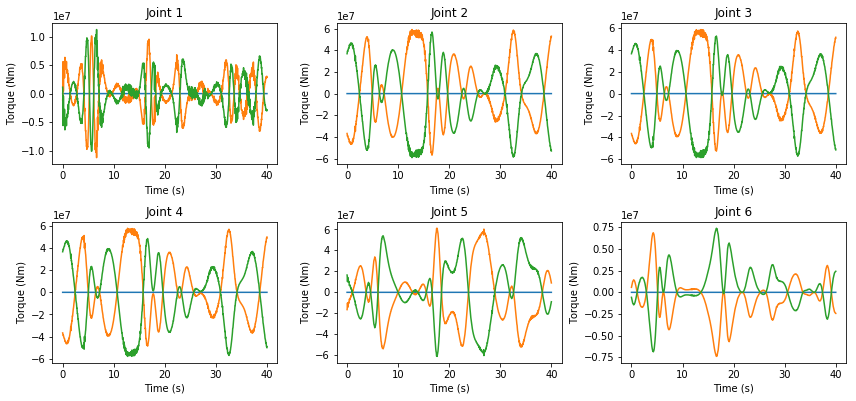

In [189]:
from matplotlib import pyplot as plt
plt.close()

plt.figure(figsize=(12,8))

axes = []
for i in range(tau.shape[1]):
    ax = plt.subplot(3, 3, i+1)
    ax.plot(t[:firsts],tau_raw[:,i][:firsts], label="Measured torque")
    ax.plot(t[:firsts],tau_pred[:,i][:firsts], label="Estimated torque")
    ax.plot(t[:firsts],err_pred[:,i][:firsts], label="Error")
    ax.set_title( "Joint %d"%(i+1) )
    plt.xlabel("Time (s)")
    plt.ylabel("Torque (Nm)")
    axes.append(ax)

plt.tight_layout()

plt.show()

In [190]:
delta_starextra = Pb*beta_starextra + (-Pb*rbt.dyn.Kd+rbt.dyn.Pd)*delta_d_starextra
K = np.matrix(Pb.T+rbt.dyn.Kd*rbt.dyn.Pd.T).astype(float)
delta_starextra_min = np.linalg.pinv(K)*beta_starextra

ShapeError: Matrices size mismatch.

In [ ]:
np.testing.assert_array_almost_equal(K * delta_starextra ,beta_starextra, 10)

In [191]:
for i in range(delta_starextra.shape[0]):
     print 'double ' + repr(rbt.dyn.dynparms[i]) + '    =    ' + repr(delta_starextra[i,0]) + ';'

NameError: name 'delta_starextra' is not defined

In [192]:
for i in range(delta_starextra.shape[0]):
     print 'double ' + repr(rbt.dyn.dynparms[i]) + '    =    ' + repr(delta_starextra_min[i,0]) + ';'

NameError: name 'delta_starextra' is not defined

---------------------------

---------------------------

---------------------------

---------------------------

---------------------------

---------------------------

---------------------------

---------------------------

---------------------------

### (generate readme and notebook preview)

In [3]:
def save_files(): 
    from IPython.display import display, Javascript
    Javascript('IPython.notebook.save_notebook()')
    
    import json
    with open('WAM7 Dynamic Parameter Identification.ipynb', 'r') as f:
        d = json.load(f)
    with open('README.md', 'w') as f:
        f.write(''.join(d['worksheets'][0]['cells'][0]['source']).encode('UTF-8'))
    
    !ipython nbconvert "WAM7 Dynamic Parameter Identification.ipynb" --to html

In [3]:
#save_files()

In [36]:
#!git status

In [37]:
#!git commit -a -m "Add automathic README.md file generator"

In [38]:
#!git push